# Dataset preparation

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler


In [3]:
gates_counts = pd.read_csv('files/extracted_info.csv')
gates_counts

,NAME,ALL_GATES,USED_GATES,IDA,INVA,AND2,OR2,XOR2,NAND2,NOR2,...,WSS,LSB%,MSB%,GLOBAL_MAX_DEPTH,MSB_MAX_DEPTH,MAX_FANOUT,GATES_FANOUT_GT_3,MAX_WIDTH,DEPTH_SKEW,CONGESTION_INDEX
0,mult8_cgp14ep_ep13107_wc0_2_rcam,320,319,0,0,167,48,104,0,0,...,508899,0.9624,0.0721,39,7,175,16,64,-32,201
1,mult8_cgp14ep_ep13107_wc0_rcam,320,320,0,0,168,48,104,0,0,...,525281,0.9656,0.0750,39,7,176,16,64,-32,203
2,mult8_cgp14ep_ep13107_wc0_wtmcla,490,381,0,2,203,66,110,0,0,...,521724,0.9528,0.0630,23,7,212,23,64,-16,205
3,mult8_cgp14ep_ep13107_wc1000_csamcsa,347,325,0,4,165,53,103,0,0,...,465970,0.9508,0.0708,25,6,173,19,64,-19,185
4,mult8_cgp14ep_ep13107_wc1008_csamcsa,347,328,0,4,167,53,104,0,0,...,506924,0.9634,0.0732,25,6,175,20,64,-19,192
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24901,mult8_cgp14ep_ep65536_wc9_csamrca,320,300,0,1,155,47,96,0,0,...,238839,0.9600,0.0267,28,3,163,16,59,-25,182
24902,mult8_cgp14ep_ep65536_wc9_rcam,320,297,0,0,155,45,97,0,0,...,1041397,0.9697,0.0943,36,8,163,16,58,-28,182
24903,mult8_cgp14ep_ep65536_wc9_wtmcla,490,336,0,0,178,58,100,0,0,...,497283,0.9613,0.0268,21,5,186,18,59,-16,186
24904,mult8_cgp14ep_ep65536_wc9_wtmcsa,418,346,0,6,178,57,105,0,0,...,260478,0.9277,0.0231,24,5,186,22,58,-19,193


In [4]:
json_data = pd.read_csv('files/json_data.csv')
json_data.columns = ['NAME', 'CELLS_JSON', 'SEED', 'MAE', 'WCE', 'WCRE', 'PDK45_AREA', 'PDK45_DELAY', 'PDK45_POWER', 'LEVELS']
json_data

,NAME,CELLS_JSON,SEED,MAE,WCE,WCRE,PDK45_AREA,PDK45_DELAY,PDK45_POWER,LEVELS
0,mult8_cgp14ep_ep13107_wc0_2_rcam,319,rcam,0.00000,0,0.000000,746.187006,2.06,415800.0,39
1,mult8_cgp14ep_ep13107_wc0_rcam,320,rcam,0.00000,0,0.000000,742.901906,2.04,413300.0,39
2,mult8_cgp14ep_ep13107_wc0_wtmcla,381,wtm_cla,0.00000,0,0.000000,853.187400,1.07,495500.0,23
3,mult8_cgp14ep_ep13107_wc1000_csamcsa,325,csam_csa,35.63379,1000,252.631579,746.187003,1.49,414200.0,25
4,mult8_cgp14ep_ep13107_wc1008_csamcsa,328,csam_csa,32.45898,1008,198.941799,767.774805,1.52,412000.0,25
...,...,...,...,...,...,...,...,...,...,...
24907,mult8_cgp14ep_ep65536_wc9_csamrca,300,csam_rca,2.96094,9,100.000000,705.827206,1.40,386900.0,28
24908,mult8_cgp14ep_ep65536_wc9_rcam,297,rcam,3.16406,9,100.000000,669.221806,1.87,395400.0,37
24909,mult8_cgp14ep_ep65536_wc9_wtmcla,336,wtm_cla,2.79688,9,350.000000,769.182700,1.39,438300.0,22
24910,mult8_cgp14ep_ep65536_wc9_wtmcsa,346,wtm_csa,3.15625,9,100.000000,786.546799,1.31,443800.0,24


In [5]:
df = pd.merge(json_data, gates_counts, left_on='NAME', right_on='NAME', how='inner')
df

,NAME,CELLS_JSON,SEED,MAE,WCE,WCRE,PDK45_AREA,PDK45_DELAY,PDK45_POWER,LEVELS,...,WSS,LSB%,MSB%,GLOBAL_MAX_DEPTH,MSB_MAX_DEPTH,MAX_FANOUT,GATES_FANOUT_GT_3,MAX_WIDTH,DEPTH_SKEW,CONGESTION_INDEX
0,mult8_cgp14ep_ep13107_wc0_2_rcam,319,rcam,0.00000,0,0.000000,746.187006,2.06,415800.0,39,...,508899,0.9624,0.0721,39,7,175,16,64,-32,201
1,mult8_cgp14ep_ep13107_wc0_rcam,320,rcam,0.00000,0,0.000000,742.901906,2.04,413300.0,39,...,525281,0.9656,0.0750,39,7,176,16,64,-32,203
2,mult8_cgp14ep_ep13107_wc0_wtmcla,381,wtm_cla,0.00000,0,0.000000,853.187400,1.07,495500.0,23,...,521724,0.9528,0.0630,23,7,212,23,64,-16,205
3,mult8_cgp14ep_ep13107_wc1000_csamcsa,325,csam_csa,35.63379,1000,252.631579,746.187003,1.49,414200.0,25,...,465970,0.9508,0.0708,25,6,173,19,64,-19,185
4,mult8_cgp14ep_ep13107_wc1008_csamcsa,328,csam_csa,32.45898,1008,198.941799,767.774805,1.52,412000.0,25,...,506924,0.9634,0.0732,25,6,175,20,64,-19,192
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24901,mult8_cgp14ep_ep65536_wc9_csamrca,300,csam_rca,2.96094,9,100.000000,705.827206,1.40,386900.0,28,...,238839,0.9600,0.0267,28,3,163,16,59,-25,182
24902,mult8_cgp14ep_ep65536_wc9_rcam,297,rcam,3.16406,9,100.000000,669.221806,1.87,395400.0,37,...,1041397,0.9697,0.0943,36,8,163,16,58,-28,182
24903,mult8_cgp14ep_ep65536_wc9_wtmcla,336,wtm_cla,2.79688,9,350.000000,769.182700,1.39,438300.0,22,...,497283,0.9613,0.0268,21,5,186,18,59,-16,186
24904,mult8_cgp14ep_ep65536_wc9_wtmcsa,346,wtm_csa,3.15625,9,100.000000,786.546799,1.31,443800.0,24,...,260478,0.9277,0.0231,24,5,186,22,58,-19,193


In [6]:
df_missing = pd.merge(json_data, gates_counts, left_on='NAME', right_on='NAME', how='outer', indicator=True)
df_missing[df_missing['_merge'] != 'both']

,NAME,CELLS_JSON,SEED,MAE,WCE,WCRE,PDK45_AREA,PDK45_DELAY,PDK45_POWER,LEVELS,...,LSB%,MSB%,GLOBAL_MAX_DEPTH,MSB_MAX_DEPTH,MAX_FANOUT,GATES_FANOUT_GT_3,MAX_WIDTH,DEPTH_SKEW,CONGESTION_INDEX,_merge
24583,mult8_cgp14ep_ep65536_wc65025_csamcsa,0,csam_csa,16256.25,65025,100.0,0.0,0.0,0.0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
24584,mult8_cgp14ep_ep65536_wc65025_csamrca,0,csam_rca,16256.25,65025,100.0,0.0,0.0,0.0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
24585,mult8_cgp14ep_ep65536_wc65025_rcam,0,rcam,16256.25,65025,100.0,0.0,0.0,0.0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
24586,mult8_cgp14ep_ep65536_wc65025_wtmcla,0,wtm_cla,16256.25,65025,100.0,0.0,0.0,0.0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
24587,mult8_cgp14ep_ep65536_wc65025_wtmcsa,0,wtm_csa,16256.25,65025,100.0,0.0,0.0,0.0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
24588,mult8_cgp14ep_ep65536_wc65025_wtmrca,0,wtm_rca,16256.25,65025,100.0,0.0,0.0,0.0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only


In [7]:
df.drop(columns=['LONGEST PATH'], inplace=True)
df.shape

(24906, 32)

# Dataset analysis

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24906 entries, 0 to 24905
Data columns (total 32 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   NAME               24906 non-null  object 
 1   CELLS_JSON         24906 non-null  int64  
 2   SEED               24906 non-null  object 
 3   MAE                24906 non-null  float64
 4   WCE                24906 non-null  int64  
 5   WCRE               24906 non-null  float64
 6   PDK45_AREA         24906 non-null  float64
 7   PDK45_DELAY        24906 non-null  float64
 8   PDK45_POWER        24906 non-null  float64
 9   LEVELS             24906 non-null  int64  
 10  ALL_GATES          24906 non-null  int64  
 11  USED_GATES         24906 non-null  int64  
 12  IDA                24906 non-null  int64  
 13  INVA               24906 non-null  int64  
 14  AND2               24906 non-null  int64  
 15  OR2                24906 non-null  int64  
 16  XOR2               249

In [9]:
# Handling missing values
df.isnull().sum()

NAME                 0
CELLS_JSON           0
SEED                 0
MAE                  0
WCE                  0
WCRE                 0
PDK45_AREA           0
PDK45_DELAY          0
PDK45_POWER          0
LEVELS               0
ALL_GATES            0
USED_GATES           0
IDA                  0
INVA                 0
AND2                 0
OR2                  0
XOR2                 0
NAND2                0
NOR2                 0
XNOR2                0
TOTAL_AREA           0
SHARING_FACTOR       0
WSS                  0
LSB%                 0
MSB%                 0
GLOBAL_MAX_DEPTH     0
MSB_MAX_DEPTH        0
MAX_FANOUT           0
GATES_FANOUT_GT_3    0
MAX_WIDTH            0
DEPTH_SKEW           0
CONGESTION_INDEX     0
dtype: int64

In [10]:
# Check for duplicates
df.duplicated().sum()

0

In [11]:
# Show unique values in "SEED" column and their counts
df['SEED'].value_counts()

SEED
wtm_csa     4218
csam_csa    4202
wtm_cla     4200
csam_rca    4140
rcam        4077
wtm_rca     4069
Name: count, dtype: int64

In [12]:
# Summary statistics
df.describe()

,CELLS_JSON,MAE,WCE,WCRE,PDK45_AREA,PDK45_DELAY,PDK45_POWER,LEVELS,ALL_GATES,USED_GATES,...,WSS,LSB%,MSB%,GLOBAL_MAX_DEPTH,MSB_MAX_DEPTH,MAX_FANOUT,GATES_FANOUT_GT_3,MAX_WIDTH,DEPTH_SKEW,CONGESTION_INDEX
count,24906.000000,24906.000000,24906.000000,2.490600e+04,24906.000000,24906.000000,24906.000000,24906.000000,24906.000000,24906.000000,...,2.490600e+04,24906.000000,24906.000000,24906.000000,24906.000000,24906.000000,24906.000000,24906.000000,24906.000000,24906.000000
mean,242.173011,763.627001,5267.406810,1.042279e+03,572.148190,1.210956,300996.048613,22.766442,371.943909,242.173011,...,5.298362e+05,0.819006,0.115571,22.417771,5.527704,134.022485,16.051634,53.837549,-16.687304,109.681402
std,86.251645,1673.129553,9302.001263,9.659348e+03,196.568972,0.408615,124982.919375,7.375686,62.869858,86.251645,...,9.239040e+05,0.225793,0.151780,7.463430,3.777518,45.546985,3.826479,14.107134,7.844291,67.678550
min,1.000000,0.000000,0.000000,0.000000e+00,2.346500,0.040000,301.750000,1.000000,320.000000,1.000000,...,1.000000e+00,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,-35.000000,0.000000
25%,194.000000,15.508177,100.000000,1.000000e+02,474.462295,1.030000,227325.000000,19.000000,320.000000,194.000000,...,2.097722e+05,0.799300,0.053200,19.000000,4.000000,109.000000,15.000000,47.000000,-22.000000,48.000000
50%,272.000000,109.633910,856.000000,1.777778e+02,644.348904,1.270000,352700.000000,24.000000,347.000000,272.000000,...,3.305240e+05,0.918900,0.068300,23.000000,5.000000,150.000000,16.000000,61.000000,-17.000000,125.000000
75%,307.000000,646.066253,5666.000000,3.444444e+02,714.743903,1.430000,396800.000000,27.000000,418.000000,307.000000,...,4.429720e+05,0.957800,0.092800,27.000000,6.000000,168.000000,18.000000,64.000000,-13.000000,168.000000
max,381.000000,16162.875000,64770.000000,1.016700e+06,954.556194,2.360000,532900.000000,40.000000,490.000000,381.000000,...,1.274368e+07,1.000000,1.000000,40.000000,38.000000,212.000000,27.000000,66.000000,4.000000,267.000000


# PARENT DETECTION

In [13]:
df.drop(columns=['IDA'], inplace=True)

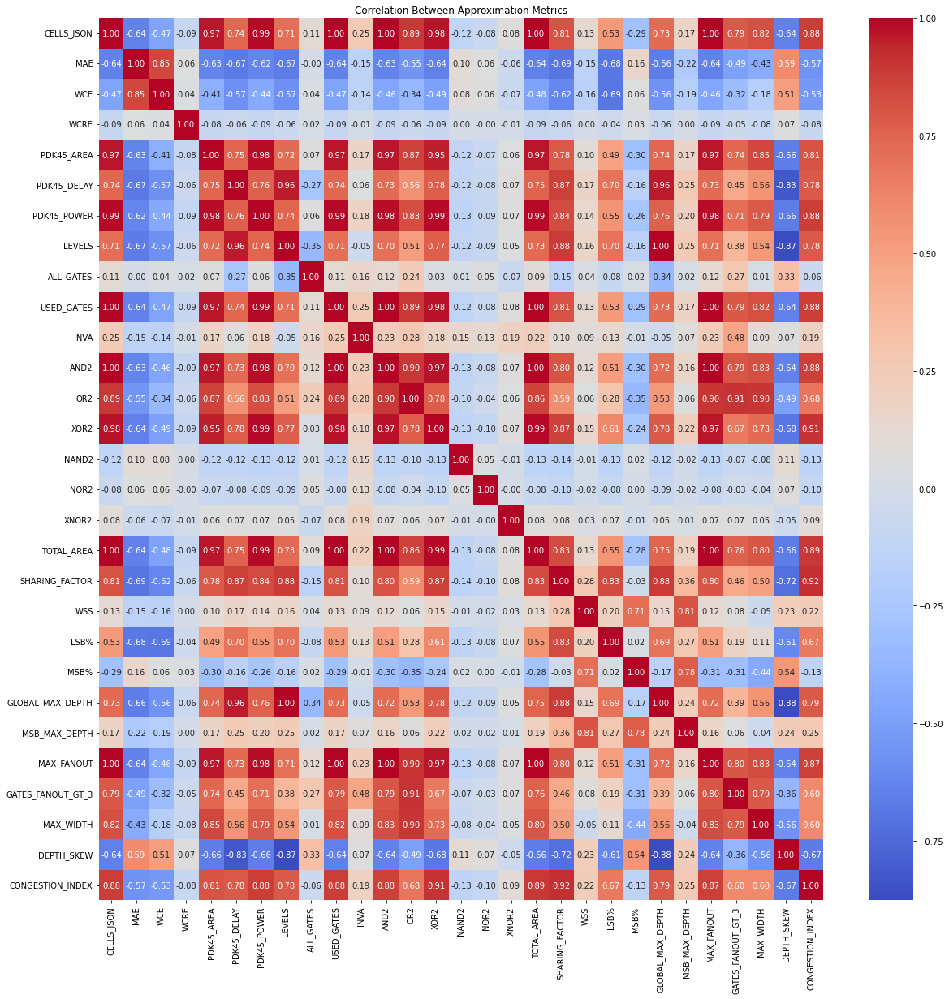

In [14]:
# 1. Calculate the correlation matrix for the numeric metrics
corr_matrix = df.select_dtypes(include=[np.number]).corr()

# 2. Visualize the Heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Between Approximation Metrics")
plt.show()

In [15]:
fast_features = ['USED_GATES', 'CELLS_JSON', 'LEVELS', 'INVA', 'AND2', 'OR2', 'XOR2', 'NAND2', 'NOR2', 'XNOR2', 'TOTAL_AREA', 
                 'WSS', 'LSB%', 'MSB%', 'GLOBAL_MAX_DEPTH', 'MSB_MAX_DEPTH', 'MAX_FANOUT', 'GATES_FANOUT_GT_3', 'MAX_WIDTH', 'DEPTH_SKEW', 'CONGESTION_INDEX', 'SEED']
slow_targets = ['MAE', 'WCE', 'WCRE', 'PDK45_AREA', 'PDK45_DELAY', 'PDK45_POWER']


In [16]:
df_fast = df[fast_features]
df_slow = df[slow_targets]

--- Correlation Coefficients (Point-Biserial) ---
                   seed_csam_csa  seed_csam_rca  seed_rcam  seed_wtm_cla  \
USED_GATES                 0.015         -0.057     -0.063         0.062   
CELLS_JSON                 0.015         -0.057     -0.063         0.062   
LEVELS                    -0.074          0.083      0.401        -0.229   
INVA                       0.440         -0.263     -0.269        -0.231   
AND2                       0.003         -0.060     -0.062         0.078   
OR2                        0.028         -0.115     -0.136         0.160   
XOR2                      -0.005         -0.010     -0.014         0.013   
NAND2                     -0.012         -0.003     -0.000         0.011   
NOR2                      -0.017         -0.035     -0.015         0.016   
XNOR2                      0.170          0.075     -0.072        -0.070   
TOTAL_AREA                 0.007         -0.043     -0.048         0.051   
WSS                        0.028      

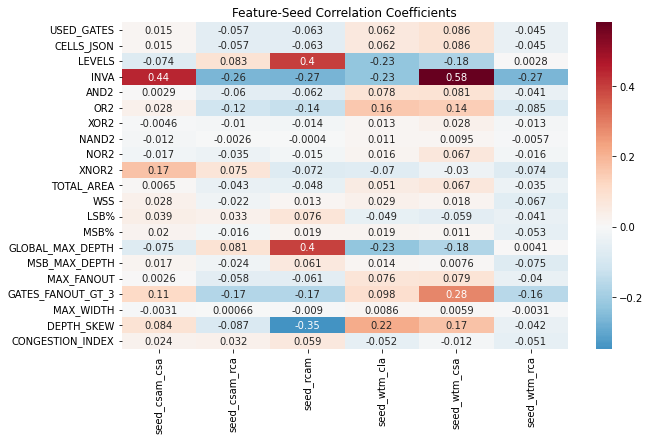

In [ ]:
# 1. Create dummy variables (One-Hot Encoding) for the SEED column
df_dummies = pd.get_dummies(df_fast, columns=['SEED'], prefix='seed')

# 2. Define original numeric features excluding seed
numeric_features = df_fast.columns.drop('SEED')

# 3. Calculate the correlation matrix for the whole dataframe
corr_matrix = df_dummies.corr()

# 4. Extract only the relationship between Features and the Seeds
seed_columns = [col for col in df_dummies.columns if col.startswith('seed_')]
coefficient_table = corr_matrix.loc[numeric_features, seed_columns]

# 5. Display the results
print("--- Correlation Coefficients (Point-Biserial) ---")
print(coefficient_table.round(3))

# 6. Optional: Visualize as a Heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(coefficient_table, annot=True, cmap='RdBu_r', center=0)
plt.title("Feature-Seed Correlation Coefficients")
plt.show()

--- Correlation Coefficients (Point-Biserial) ---
                   seed_csam_csa  seed_csam_rca  seed_rcam  seed_wtm_cla  \
USED_GATES                 0.027         -0.099     -0.097         0.098   
CELLS_JSON                 0.027         -0.099     -0.097         0.098   
LEVELS                    -0.059          0.178      0.394        -0.328   
INVA                       0.469         -0.253     -0.277        -0.217   
AND2                       0.006         -0.102     -0.095         0.118   
OR2                        0.071         -0.195     -0.213         0.238   
XOR2                      -0.010         -0.029     -0.024         0.021   
NAND2                     -0.011         -0.004     -0.003         0.010   
NOR2                      -0.017         -0.035     -0.016         0.017   
XNOR2                      0.170          0.076     -0.073        -0.070   
TOTAL_AREA                 0.012         -0.079     -0.075         0.081   
WSS                        0.021      

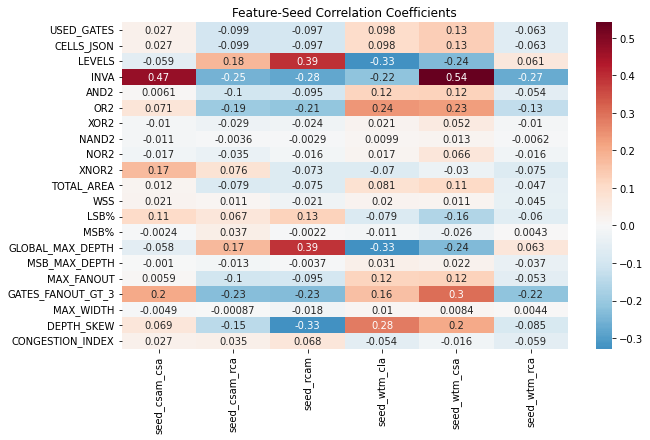

In [18]:
# 1. Create dummy variables (One-Hot Encoding) for the SEED column
# This creates new columns: SEED_Kama, SEED_Rosa, etc., filled with 0s and 1s
df_dummies = pd.get_dummies(df_fast, columns=['SEED'], prefix='seed')

# 2. Define your original numeric features
# (Excludes the newly created dummy columns)
numeric_features = df_fast.columns.drop('SEED')

# 3. Calculate the correlation matrix for the whole dataframe
corr_matrix = df_dummies.corr(method='spearman')  # Pearson correlation is used for continuous variables, but since we have binary dummies, it will give us the point-biserial correlation

# 4. Extract only the relationship between Features and the Seeds
# We look at the rows (Features) and columns (Seed Dummies)
seed_columns = [col for col in df_dummies.columns if col.startswith('seed_')]
coefficient_table = corr_matrix.loc[numeric_features, seed_columns]

# 5. Display the results
print("--- Correlation Coefficients (Point-Biserial) ---")
print(coefficient_table.round(3))

# 6. Optional: Visualize as a Heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(coefficient_table, annot=True, cmap='RdBu_r', center=0)
plt.title("Feature-Seed Correlation Coefficients")
plt.show()

C:\Users\nivan\AppData\Local\Temp\ipykernel_23056\381294032.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df_fast, palette='viridis', showfliers=False)
C:\Users\nivan\AppData\Local\Temp\ipykernel_23056\381294032.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df_fast, palette='viridis', showfliers=False)
C:\Users\nivan\AppData\Local\Temp\ipykernel_23056\381294032.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df_fast, palette='viridis', showfliers=Fa

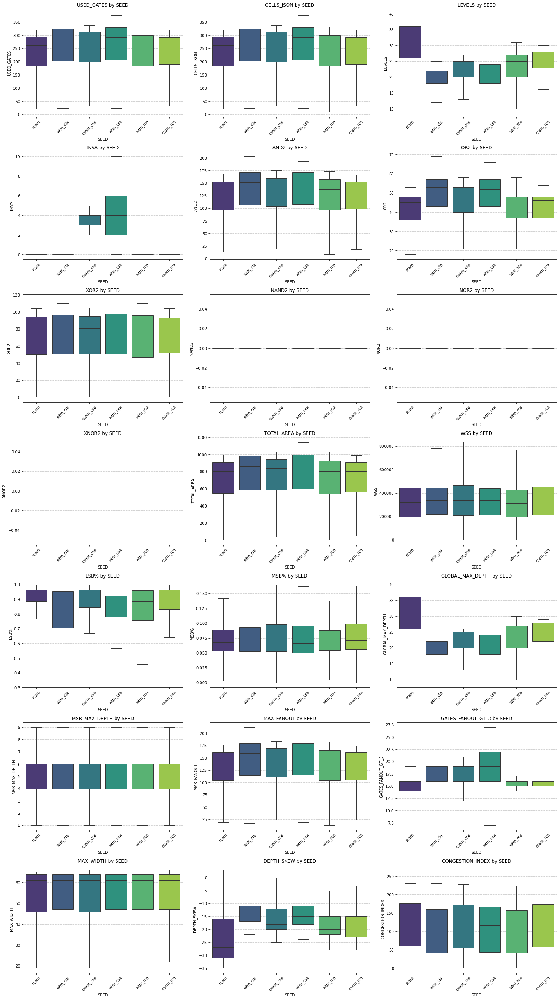

In [19]:
features = df_fast.columns.drop('SEED') # Change 'Type' to your target column name

plt.figure(figsize=(20, 50))
for i, feature in enumerate(features):
    plt.subplot(10, 3, i+1)
    sns.boxplot(x='SEED', y=feature, data=df_fast, palette='viridis', showfliers=False)
    plt.title(f'{feature} by SEED')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

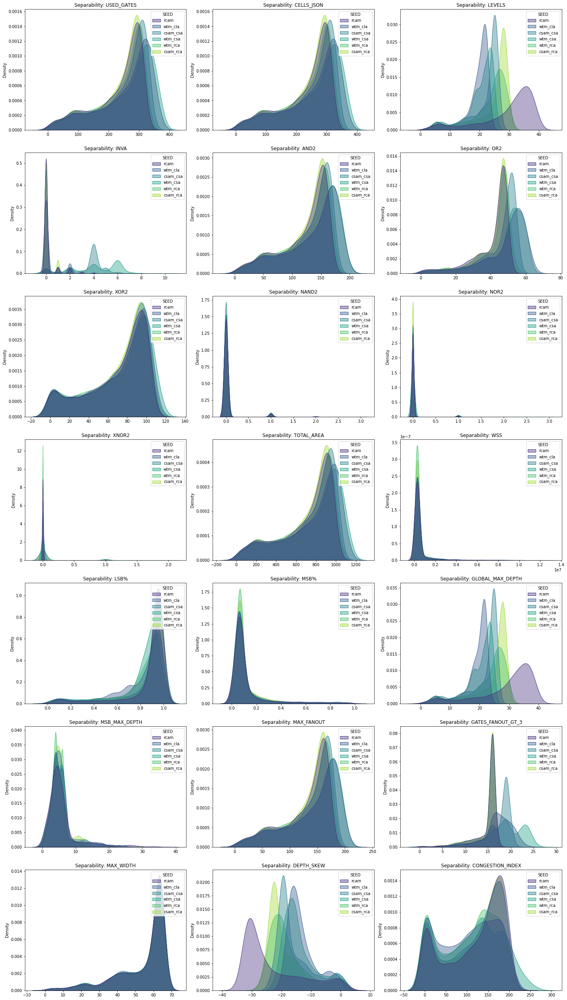

In [20]:
# 1. Generate Overlapping Density Plots for all features
# Identify your numeric features (excluding the target)
features = df_fast.columns.drop('SEED') # Change 'Type' to your target column name

plt.figure(figsize=(20, 50))
for i, feature in enumerate(features):
    plt.subplot(10, 3, i+1)
    sns.kdeplot(data=df_fast, x=feature, hue='SEED', fill=True, alpha=0.4, palette='viridis')
    plt.title(f'Separability: {feature}')
    plt.xlabel('')

plt.tight_layout()
plt.show()

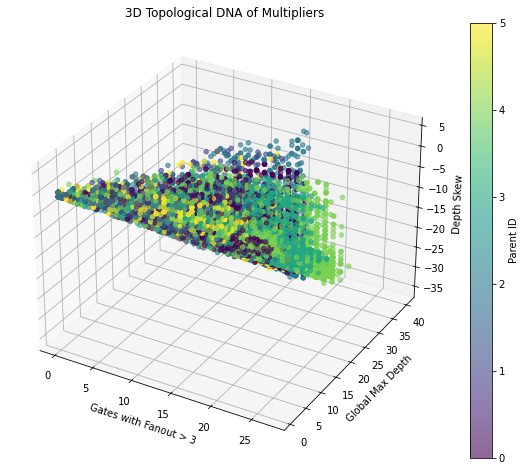

In [21]:
# Quick 3D Visualization of your top features
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Replace with your actual column names
sc = ax.scatter(df['GATES_FANOUT_GT_3'], 
                df['GLOBAL_MAX_DEPTH'], 
                df['DEPTH_SKEW'], 
                c=df['SEED'].astype('category').cat.codes, 
                cmap='viridis', alpha=0.6)

ax.set_xlabel('Gates with Fanout > 3')
ax.set_ylabel('Global Max Depth')
ax.set_zlabel('Depth Skew')
plt.title('3D Topological DNA of Multipliers')
plt.colorbar(sc, label='Parent ID')
plt.show()

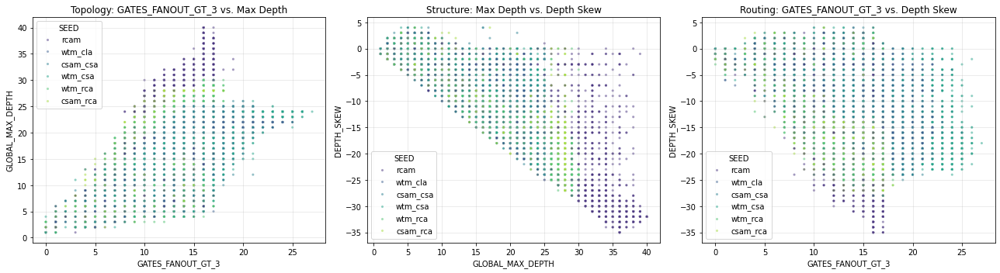

In [22]:
import matplotlib.pyplot as plt
# Define your top 3 features
top_features = ['GATES_FANOUT_GT_3', 'GLOBAL_MAX_DEPTH', 'DEPTH_SKEW']

# Set up the figure for 3 pairwise comparisons
plt.figure(figsize=(18, 5))

# Plot 1: Congestion vs Depth
plt.subplot(1, 3, 1)
sns.scatterplot(data=df, x='GATES_FANOUT_GT_3', y='GLOBAL_MAX_DEPTH', 
                hue='SEED', palette='viridis', alpha=0.5, s=10)
plt.title('Topology: GATES_FANOUT_GT_3 vs. Max Depth')
plt.grid(True, alpha=0.3)

# Plot 2: Depth vs Skew
plt.subplot(1, 3, 2)
sns.scatterplot(data=df, x='GLOBAL_MAX_DEPTH', y='DEPTH_SKEW', 
                hue='SEED', palette='viridis', alpha=0.5, s=10)
plt.title('Structure: Max Depth vs. Depth Skew')
plt.grid(True, alpha=0.3)

# Plot 3: Congestion vs Skew
plt.subplot(1, 3, 3)
sns.scatterplot(data=df, x='GATES_FANOUT_GT_3', y='DEPTH_SKEW', 
                hue='SEED', palette='viridis', alpha=0.5, s=10)
plt.title('Routing: GATES_FANOUT_GT_3 vs. Depth Skew')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

<Figure size 1440x1080 with 0 Axes>

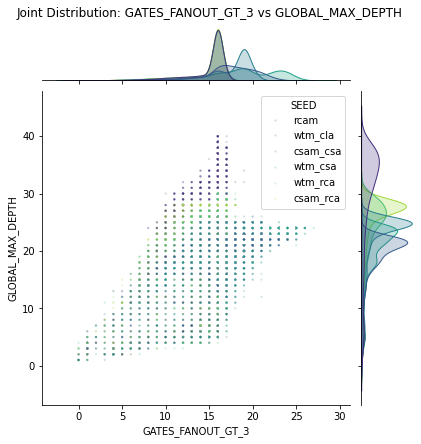

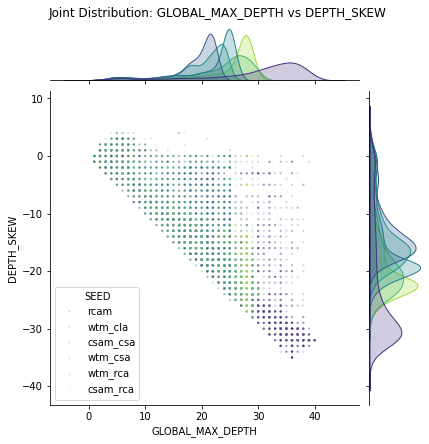

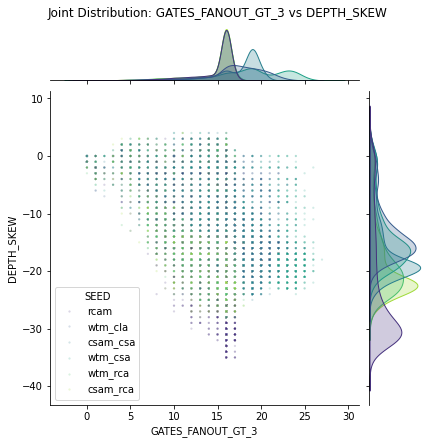

In [23]:
pairs = [('GATES_FANOUT_GT_3', 'GLOBAL_MAX_DEPTH'), 
         ('GLOBAL_MAX_DEPTH', 'DEPTH_SKEW'), 
         ('GATES_FANOUT_GT_3', 'DEPTH_SKEW')]

plt.figure(figsize=(20, 15))

for x_col, y_col in pairs:
    # kind='kde' would be cleaner, but 'scatter' with alpha shows the raw data density
    sns.jointplot(data=df, x=x_col, y=y_col, hue='SEED', 
                      kind='scatter', alpha=0.2, palette='viridis', s=5)
    plt.suptitle(f'Joint Distribution: {x_col} vs {y_col}', y=1.02)
    
    plt.show()

In [24]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier

X = df[fast_features].drop(columns=['SEED'])
y = df['SEED'] 
clf = RandomForestClassifier(n_estimators=100)
selector = RFE(clf, n_features_to_select=10, step=1)
selector = selector.fit(X, y)

# This tells you which features survived the cut
selected_features = X.columns[selector.support_]
print(selected_features)

Index(['LEVELS', 'INVA', 'AND2', 'OR2', 'TOTAL_AREA', 'LSB%',
       'GLOBAL_MAX_DEPTH', 'MAX_FANOUT', 'GATES_FANOUT_GT_3', 'DEPTH_SKEW'],
      dtype='object')


In [25]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# 1. Prepare Features (X) and Target (y)
X = df_fast.drop(columns=['SEED']) # Drop target and non-feature columns
y = df['SEED']

# 2. Encode labels (Seed 1, Seed 2... -> 0, 1, 2...)
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# 3. Split: 80% Train, 20% Test
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

# 4. Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [26]:
from sklearn.linear_model import LogisticRegression

baseline = LogisticRegression(max_iter=1000, multi_class='multinomial')
baseline.fit(X_train_scaled, y_train)

y_pred_base = baseline.predict(X_test_scaled)
print(f"Baseline Accuracy: {accuracy_score(y_test, y_pred_base):.4f}")

Baseline Accuracy: 0.7635


In [27]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100, max_depth=15, random_state=42, n_jobs=-1)
rf.fit(X_train, y_train) # Trees don't strictly need scaling, using raw X_train

y_pred_rf = rf.predict(X_test)
print(f"Random Forest Accuracy: {accuracy_score(y_test, y_pred_rf):.4f}")

Random Forest Accuracy: 0.8177


In [28]:
from xgboost import XGBClassifier

xgb = XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=6, random_state=42)
xgb.fit(X_train, y_train)

y_pred_xgb = xgb.predict(X_test)
print(f"XGBoost Accuracy: {accuracy_score(y_test, y_pred_xgb):.4f}")

XGBoost Accuracy: 0.8204


In [29]:
# F1 score for all models
from sklearn.metrics import f1_score

print(f"Baseline F1 Score: {f1_score(y_test, y_pred_base, average='weighted'):.4f}")
print(f"Random Forest F1 Score: {f1_score(y_test, y_pred_rf, average='weighted'):.4f}")
print(f"XGBoost F1 Score: {f1_score(y_test, y_pred_xgb, average='weighted'):.4f}")


Baseline F1 Score: 0.7610
Random Forest F1 Score: 0.8172
XGBoost F1 Score: 0.8196


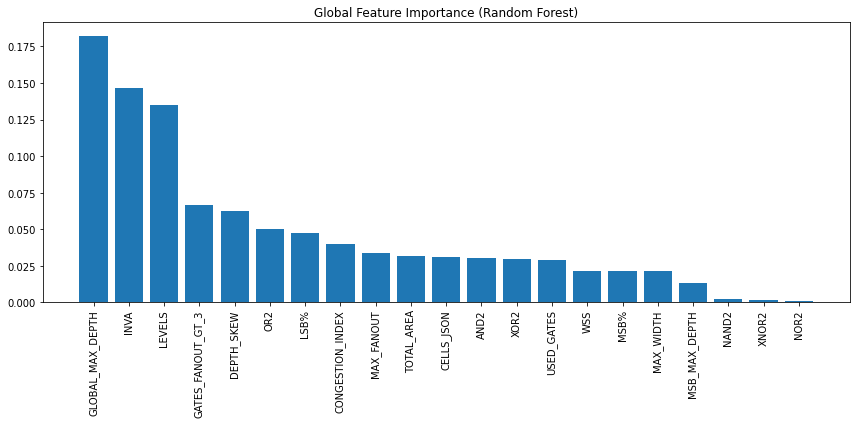

In [30]:
import numpy as np

importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12, 6))
plt.title("Global Feature Importance (Random Forest)")
plt.bar(range(X.shape[1]), importances[indices], align="center")
plt.xticks(range(X.shape[1]), [X.columns[i] for i in indices], rotation=90)
plt.tight_layout()
plt.show()

              precision    recall  f1-score   support

    csam_csa       0.84      0.87      0.85       841
    csam_rca       0.80      0.76      0.78       828
        rcam       0.83      0.90      0.86       815
     wtm_cla       0.86      0.83      0.84       840
     wtm_csa       0.81      0.83      0.82       844
     wtm_rca       0.79      0.73      0.76       814

    accuracy                           0.82      4982
   macro avg       0.82      0.82      0.82      4982
weighted avg       0.82      0.82      0.82      4982



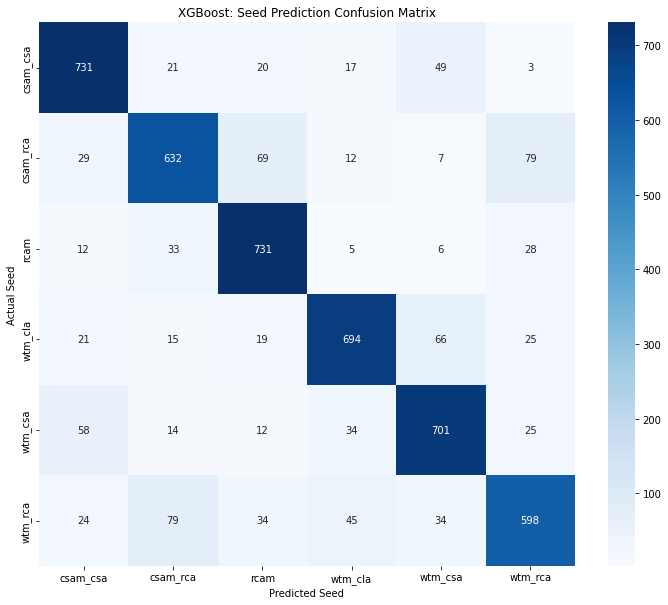

In [31]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Print detailed metrics
print(classification_report(y_test, y_pred_xgb, target_names=le.classes_))

# Plot the Confusion Matrix
plt.figure(figsize=(12, 10))
cm = confusion_matrix(y_test, y_pred_xgb)
sns.heatmap(cm, annot=True, fmt='d', xticklabels=le.classes_, yticklabels=le.classes_, cmap='Blues')
plt.title('XGBoost: Seed Prediction Confusion Matrix')
plt.ylabel('Actual Seed')
plt.xlabel('Predicted Seed')
plt.show()

In [32]:
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBClassifier

# 1. Define the parameter space
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 6, 9, 12],
    'subsample': [0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.7, 0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2, 0.5]
}

# 2. Setup the search
# cv=5 means 5-fold cross-validation
xgb_search = RandomizedSearchCV(
    estimator=XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='mlogloss'),
    param_distributions=param_grid,
    n_iter=25,        # Try 25 different combinations
    scoring='accuracy',
    cv=5, 
    verbose=2, 
    random_state=42,
    n_jobs=-1         # Use all CPU cores
)

# 3. Run the search
xgb_search.fit(X_train, y_train)

print(f"Best Params: {xgb_search.best_params_}")
print(f"Best CV Accuracy: {xgb_search.best_score_:.4f}")

# 4. Evaluate the best model on the test set
best_xgb = xgb_search.best_estimator_
y_final_pred = best_xgb.predict(X_test)

Fitting 5 folds for each of 25 candidates, totalling 125 fits


C:\Users\nivan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\xgboost\training.py:200: UserWarning: [18:26:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Best Params: {'subsample': 0.9, 'n_estimators': 300, 'max_depth': 12, 'learning_rate': 0.1, 'gamma': 0.2, 'colsample_bytree': 0.8}
Best CV Accuracy: 0.8212


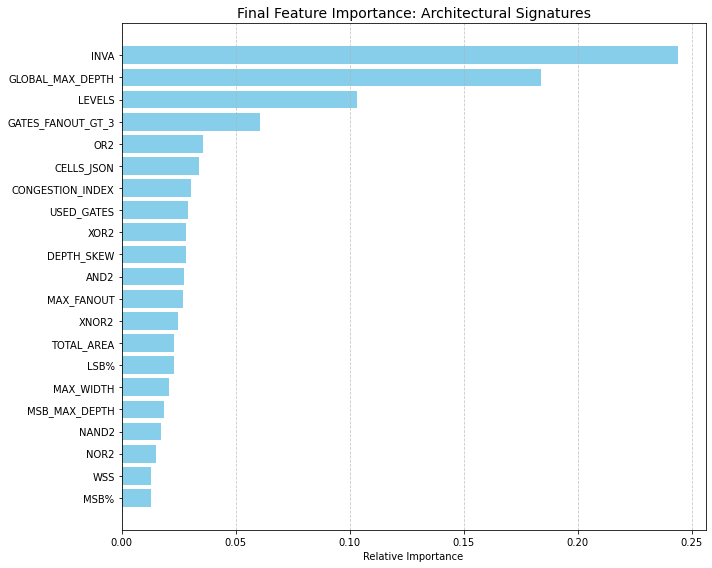

In [33]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'best_xgb' is your tuned model and 'X' is your features dataframe
importances = best_xgb.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(10, 8))
plt.title('Final Feature Importance: Architectural Signatures', fontsize=14)
plt.barh(range(len(indices)), importances[indices], color='skyblue', align='center')
plt.yticks(range(len(indices)), [X.columns[i] for i in indices])
plt.xlabel('Relative Importance')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [34]:
# SHAP explainer for XGBoost

# Add some feature engineering

In [35]:
df_eng = df_fast.copy()

# 1. Ratios
df_eng['XOR_RATIO'] = df_eng['XOR2'] / (df_eng['USED_GATES'] + 1e-9)
df_eng['LOGIC_WIDTH'] = df_eng['USED_GATES'] / (df_eng['GLOBAL_MAX_DEPTH'] + 1e-9)
df_eng['FANOUT_DENSITY'] = df_eng['GATES_FANOUT_GT_3'] / (df_eng['USED_GATES'] + 1e-9)

# 2. Normalized Topology
df_eng['NORM_SKEW'] = df_eng['DEPTH_SKEW'] / (df_eng['GLOBAL_MAX_DEPTH'] + 1e-9)

# 3. Interaction
df_eng['TOPOLOGICAL_STRESS'] = df_eng['CONGESTION_INDEX'] * df_eng['GLOBAL_MAX_DEPTH']

# Check for NaNs or Infinities just in case
df_eng = df_eng.replace([np.inf, -np.inf], np.nan).fillna(0)

--- Correlation Coefficients ENG(Point-Biserial) ---
                   seed_csam_csa  seed_csam_rca  seed_rcam  seed_wtm_cla  \
USED_GATES                 0.027         -0.099     -0.097         0.098   
CELLS_JSON                 0.027         -0.099     -0.097         0.098   
LEVELS                    -0.059          0.178      0.394        -0.328   
INVA                       0.469         -0.253     -0.277        -0.217   
AND2                       0.006         -0.102     -0.095         0.118   
OR2                        0.071         -0.195     -0.213         0.238   
XOR2                      -0.010         -0.029     -0.024         0.021   
NAND2                     -0.011         -0.004     -0.003         0.010   
NOR2                      -0.017         -0.035     -0.016         0.017   
XNOR2                      0.170          0.076     -0.073        -0.070   
TOTAL_AREA                 0.012         -0.079     -0.075         0.081   
WSS                        0.021   

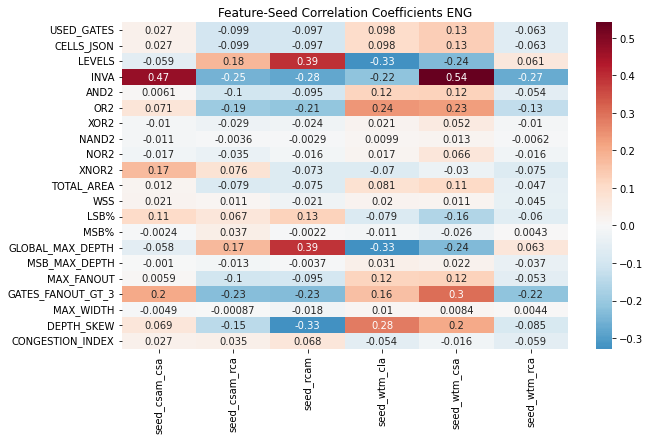

In [36]:
# 1. Create dummy variables (One-Hot Encoding) for the SEED column
# This creates new columns: SEED_Kama, SEED_Rosa, etc., filled with 0s and 1s
df_dummies_eng = pd.get_dummies(df_eng, columns=['SEED'], prefix='seed')

# 2. Define your original numeric features
# (Excludes the newly created dummy columns)
numeric_features_eng = df_eng.columns.drop('SEED')

# 3. Calculate the correlation matrix for the whole dataframe
corr_matrix_eng = df_dummies.corr(method='spearman')  # Pearson correlation is used for continuous variables, but since we have binary dummies, it will give us the point-biserial correlation

# 4. Extract only the relationship between Features and the Seeds
# We look at the rows (Features) and columns (Seed Dummies)
seed_columns_eng = [col for col in df_dummies.columns if col.startswith('seed_')]
coefficient_table_eng = corr_matrix.loc[numeric_features, seed_columns]

# 5. Display the results
print("--- Correlation Coefficients ENG(Point-Biserial) ---")
print(coefficient_table_eng.round(3))

# 6. Optional: Visualize as a Heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(coefficient_table_eng, annot=True, cmap='RdBu_r', center=0)
plt.title("Feature-Seed Correlation Coefficients ENG")
plt.show()

In [37]:
# 1. Prepare Features (X) and Target (y)
X_eng = df_eng.drop(columns=['SEED']) # Drop target and non-feature columns
y_eng = df['SEED']

# 2. Encode labels (Seed 1, Seed 2... -> 0, 1, 2...)
le_eng = LabelEncoder()
y_encoded_eng = le_eng.fit_transform(y)

# 3. Split: 80% Train, 20% Test
X_train_eng, X_test_eng, y_train_eng, y_test_eng = train_test_split(X_eng, y_encoded_eng, test_size=0.2, random_state=42, stratify=y_encoded_eng)

# 4. Scale features
scaler_eng = StandardScaler()
X_train_scaled_eng = scaler_eng.fit_transform(X_train_eng)
X_test_scaled_eng = scaler_eng.transform(X_test_eng)

In [38]:
baseline_eng = LogisticRegression(max_iter=1000, multi_class='multinomial')
baseline_eng.fit(X_train_scaled_eng, y_train_eng)

y_pred_base_eng = baseline_eng.predict(X_test_scaled_eng)
print(f"Baseline Accuracy ENG: {accuracy_score(y_test_eng, y_pred_base_eng):.4f}")

rf_eng = RandomForestClassifier(n_estimators=100, max_depth=15, random_state=42, n_jobs=-1)
rf_eng.fit(X_train_eng, y_train_eng) # Trees don't strictly need scaling, using raw X_train

y_pred_rf_eng = rf_eng.predict(X_test_eng)
print(f"Random Forest Accuracy ENG: {accuracy_score(y_test_eng, y_pred_rf_eng):.4f}")

xgb_eng = XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=6, random_state=42)
xgb_eng.fit(X_train_eng, y_train_eng)

y_pred_xgb_eng = xgb_eng.predict(X_test_eng)
print(f"XGBoost Accuracy ENG: {accuracy_score(y_test_eng, y_pred_xgb_eng):.4f}")

print(f"Baseline F1 Score: {f1_score(y_test_eng, y_pred_base_eng, average='weighted'):.4f}")
print(f"Random Forest F1 Score: {f1_score(y_test_eng, y_pred_rf_eng, average='weighted'):.4f}")
print(f"XGBoost F1 Score: {f1_score(y_test_eng, y_pred_xgb_eng, average='weighted'):.4f}")

Baseline Accuracy ENG: 0.7734
Random Forest Accuracy ENG: 0.8240
XGBoost Accuracy ENG: 0.8246
Baseline F1 Score: 0.7720
Random Forest F1 Score: 0.8233
XGBoost F1 Score: 0.8237


              precision    recall  f1-score   support

    csam_csa       0.80      0.88      0.84       841
    csam_rca       0.79      0.77      0.78       828
        rcam       0.84      0.92      0.88       815
     wtm_cla       0.87      0.83      0.85       840
     wtm_csa       0.83      0.82      0.83       844
     wtm_rca       0.82      0.73      0.78       814

    accuracy                           0.82      4982
   macro avg       0.83      0.82      0.82      4982
weighted avg       0.83      0.82      0.82      4982



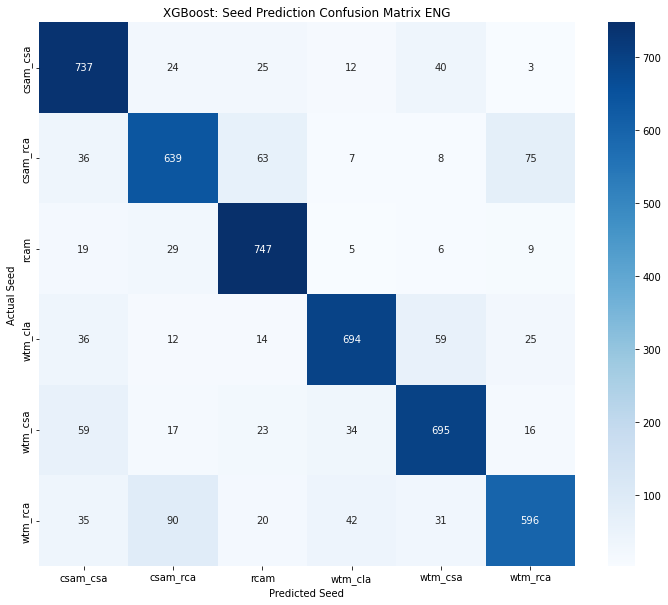

In [39]:
# Print detailed metrics
print(classification_report(y_test_eng, y_pred_xgb_eng, target_names=le_eng.classes_))

# Plot the Confusion Matrix
plt.figure(figsize=(12, 10))
cm_eng = confusion_matrix(y_test_eng, y_pred_xgb_eng)
sns.heatmap(cm_eng, annot=True, fmt='d', xticklabels=le_eng.classes_, yticklabels=le_eng.classes_, cmap='Blues')
plt.title('XGBoost: Seed Prediction Confusion Matrix ENG')
plt.ylabel('Actual Seed')
plt.xlabel('Predicted Seed')
plt.show()

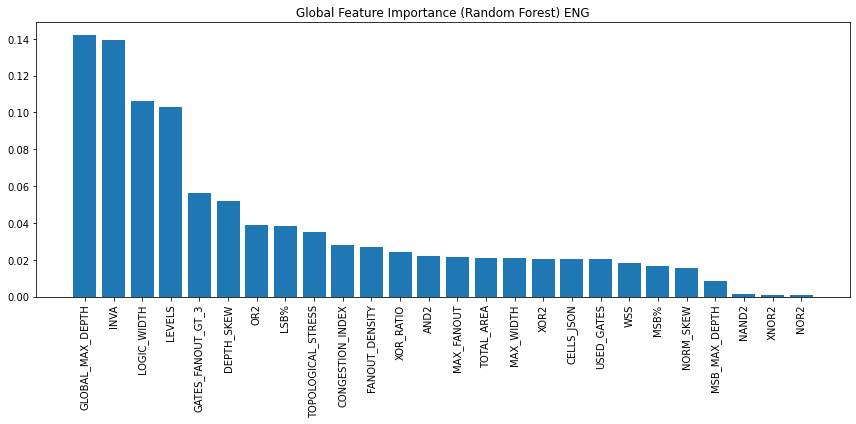

In [40]:
importances_eng = rf_eng.feature_importances_
indices_eng = np.argsort(importances_eng)[::-1]

plt.figure(figsize=(12, 6))
plt.title("Global Feature Importance (Random Forest) ENG")
plt.bar(range(X_eng.shape[1]), importances_eng[indices_eng], align="center")
plt.xticks(range(X_eng.shape[1]), [X_eng.columns[i] for i in indices_eng], rotation=90)
plt.tight_layout()
plt.show()

# Temp


In [41]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier

X_eng = df_eng[fast_features].drop(columns=['SEED'])
y_eng = df_eng['SEED'] 
clf_eng = RandomForestClassifier(n_estimators=100)
selector_eng = RFE(clf_eng, n_features_to_select=10, step=1)
selector_eng = selector_eng.fit(X_eng, y_eng)

# This tells you which features survived the cut
selected_features_eng = X_eng.columns[selector_eng.support_]
print(selected_features_eng)

Index(['LEVELS', 'INVA', 'OR2', 'TOTAL_AREA', 'LSB%', 'GLOBAL_MAX_DEPTH',
       'MAX_FANOUT', 'GATES_FANOUT_GT_3', 'DEPTH_SKEW', 'CONGESTION_INDEX'],
      dtype='object')


In [42]:
def correlation_ratio(categories, measurements):
    fcat = pd.Categorical(categories)
    cat_num = fcat.codes
    y_avg = np.mean(measurements)
    
    # Calculate the weighted variance of the category means
    numerator = 0
    for n in np.unique(cat_num):
        sub_group = measurements[cat_num == n]
        numerator += len(sub_group) * (np.mean(sub_group) - y_avg)**2
    
    # Calculate total variance
    denominator = np.sum((measurements - y_avg)**2)
    
    return np.sqrt(numerator / denominator) if denominator != 0 else 0

# Apply to your dataframe
df_fast['SEED'] = df['SEED'] 
results = {}
metrics = df_fast.select_dtypes(include=[np.number]).columns

for col in metrics:
    results[col] = correlation_ratio(df_fast['SEED'], df_fast[col])

# Sort and see the top 5 markers
ranked_features = pd.Series(results).sort_values(ascending=False)
print(ranked_features.head(10))

INVA                 0.813601
LEVELS               0.463671
GLOBAL_MAX_DEPTH     0.459070
DEPTH_SKEW           0.421169
GATES_FANOUT_GT_3    0.391740
OR2                  0.268147
XNOR2                0.206374
AND2                 0.134841
MAX_FANOUT           0.131799
USED_GATES           0.131286
dtype: float64


C:\Users\nivan\AppData\Local\Temp\ipykernel_23056\1521095973.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_fast['SEED'] = df['SEED']


In [43]:
gate_counts = df_fast.groupby(['SEED', 'ALL_GATES']).size().unstack(fill_value=0)

print(gate_counts)

KeyError: 'ALL_GATES'

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2547296782.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[0], x='SEED', y='INVA_DENSITY', data=df, palette='viridis')


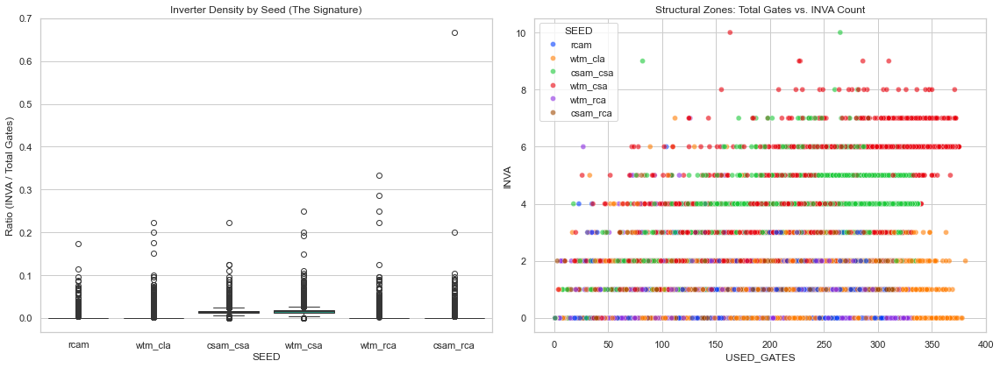

Correlation Ratio (eta) for Inverter Density: 0.5122


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Calculate the 'Inverter Density' (Normalize the marker)
# Adjust these column names to match your dataset
# If your INVA count is a column, use that.
df['INVA_DENSITY'] = df['INVA'] / df['USED_GATES']

# Set the visual style
sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot A: Boxplot of Density by Seed
# This shows if the "Ratio" is a stable signature
sns.boxplot(ax=axes[0], x='SEED', y='INVA_DENSITY', data=df, palette='viridis')
axes[0].set_title('Inverter Density by Seed (The Signature)')
axes[0].set_ylabel('Ratio (INVA / Total Gates)')

# Plot B: Scatter Plot (Raw INVA vs Total Gates)
# This shows the "Zones" of complexity
sns.scatterplot(ax=axes[1], x='USED_GATES', y='INVA', 
                hue='SEED', data=df, palette='bright', alpha=0.6)
axes[1].set_title('Structural Zones: Total Gates vs. INVA Count')

plt.tight_layout()
plt.show()

# 2. Check the Separability Score for the Ratio
def correlation_ratio(categories, measurements):
    fcat = pd.Categorical(categories)
    cat_num = fcat.codes
    y_avg = np.mean(measurements)
    numerator = 0
    for n in np.unique(cat_num):
        sub_group = measurements[cat_num == n]
        numerator += len(sub_group) * (np.mean(sub_group) - y_avg)**2
    denominator = np.sum((measurements - y_avg)**2)
    return np.sqrt(numerator / denominator) if denominator != 0 else 0

eta_ratio = correlation_ratio(df['SEED'], df['INVA_DENSITY'])
print(f"Correlation Ratio (eta) for Inverter Density: {eta_ratio:.4f}")

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2123906196.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y='INVA', data=df, palette='viridis')


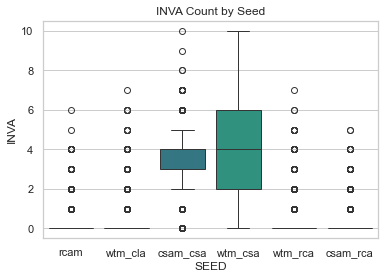

In [ ]:
# Boxoplot of INVA by SEED
sns.boxplot(x='SEED', y='INVA', data=df, palette='viridis')
plt.title('INVA Count by Seed')
plt.show()

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2150675125.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y='GATES_FANOUT_GT_3', data=df, palette='viridis')


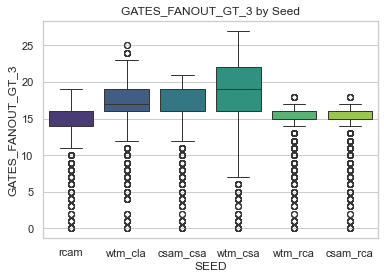

In [ ]:
sns.boxplot(x='SEED', y='GATES_FANOUT_GT_3', data=df, palette='viridis')
plt.title('GATES_FANOUT_GT_3 by Seed') 
plt.show()

In [ ]:
diff = df["LEVELS"] - df["GLOBAL_MAX_DEPTH"]
diff.value_counts()

0    16233
1     8662
2       11
Name: count, dtype: int64

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


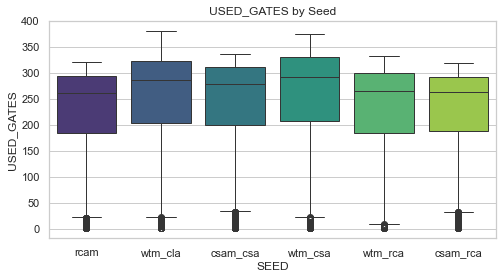

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


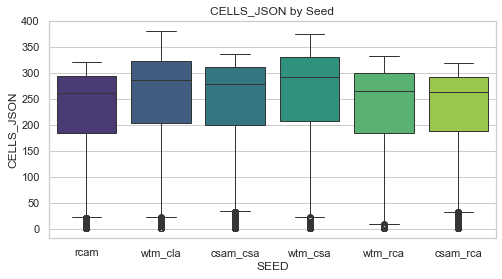

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


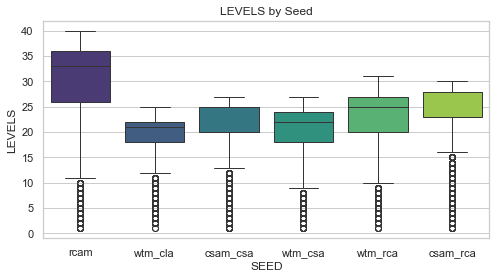

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


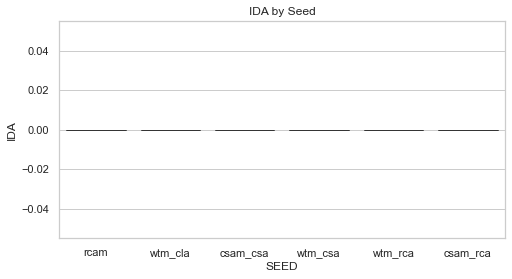

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


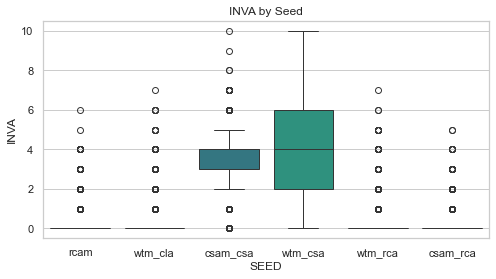

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


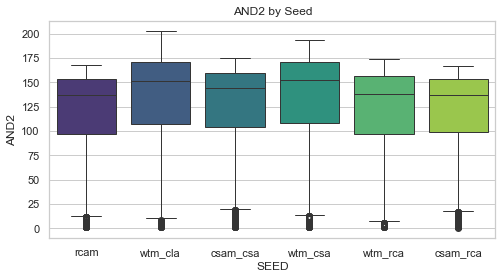

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


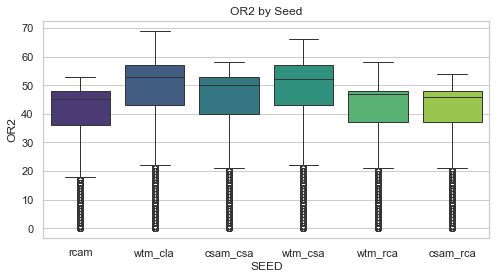

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


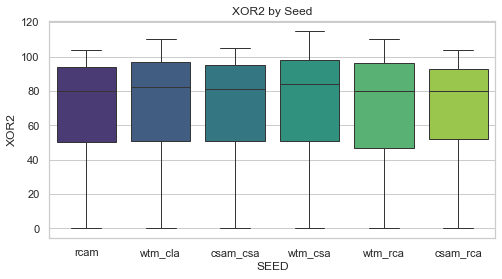

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


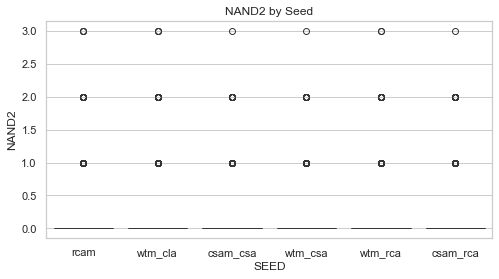

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


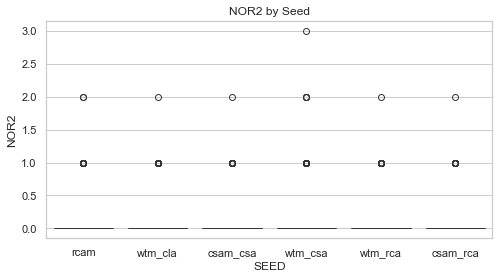

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


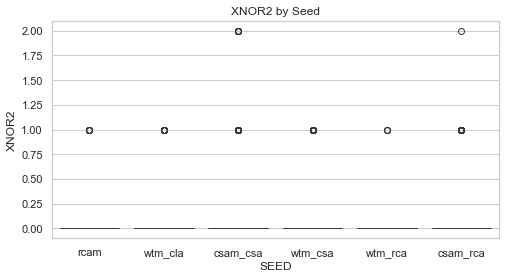

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


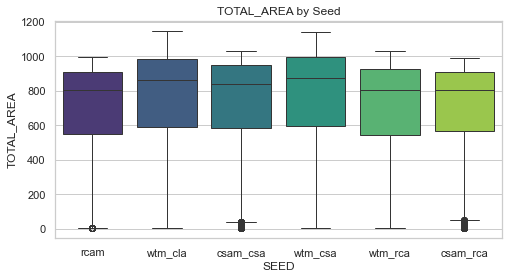

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


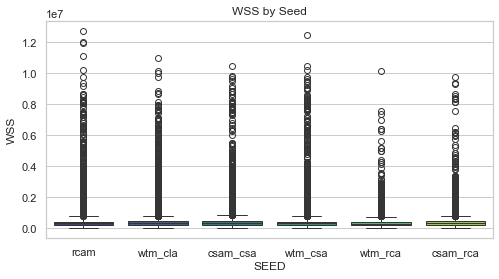

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


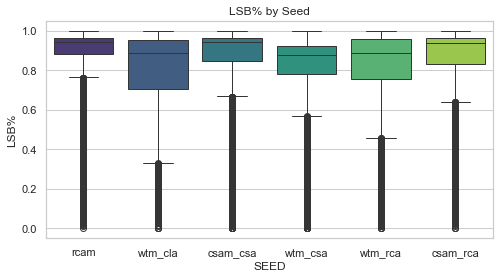

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


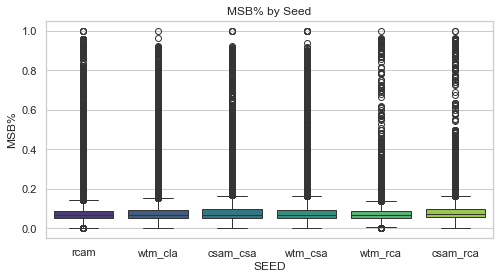

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


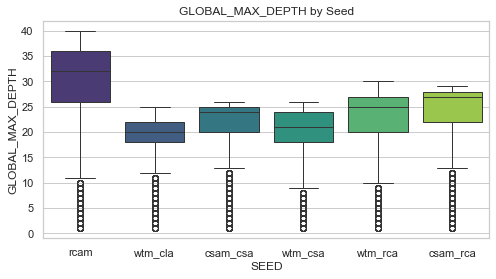

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


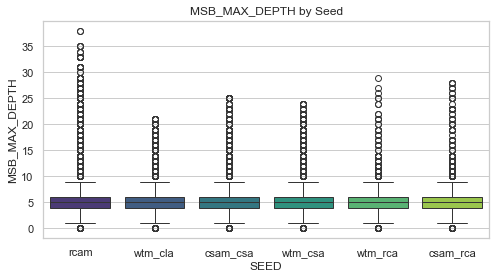

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


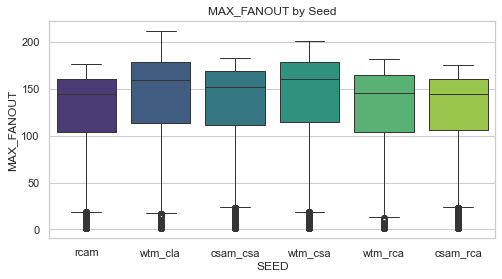

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


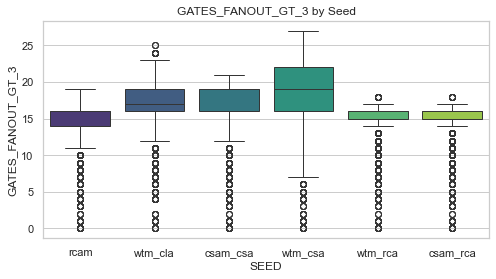

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


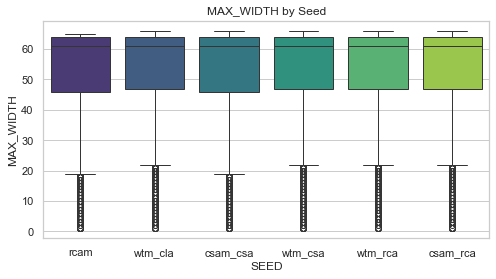

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


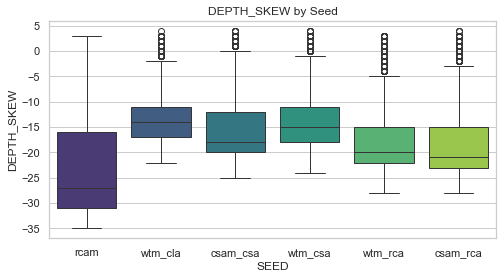

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\2209188620.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')


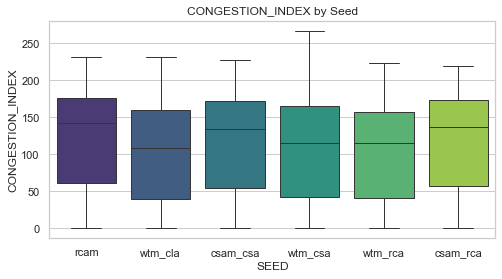

In [ ]:
# plot boxplots of all fast features by SEED
for feature in fast_features:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x='SEED', y=feature, data=df, palette='viridis')
    plt.title(f'{feature} by Seed')
    plt.show()



C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\803675840.py:8: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df_fast, x=feature, hue='SEED', fill=True, alpha=0.4, palette='viridis')


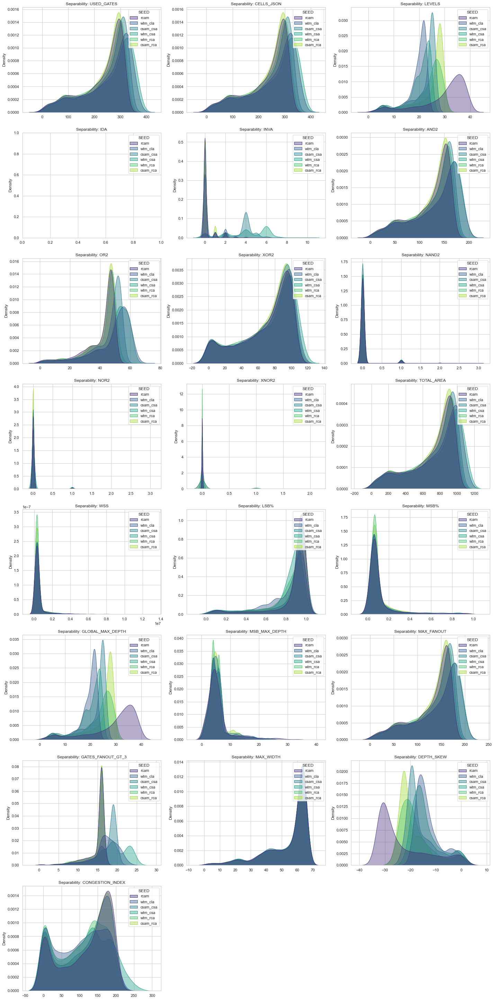

In [ ]:
# 1. Generate Overlapping Density Plots for all features
# Identify your numeric features (excluding the target)
features = df_fast.columns.drop('SEED') # Change 'Type' to your target column name

plt.figure(figsize=(20, 50))
for i, feature in enumerate(features):
    plt.subplot(10, 3, i+1)
    sns.kdeplot(data=df_fast, x=feature, hue='SEED', fill=True, alpha=0.4, palette='viridis')
    plt.title(f'Separability: {feature}')
    plt.xlabel('')

plt.tight_layout()
plt.show()


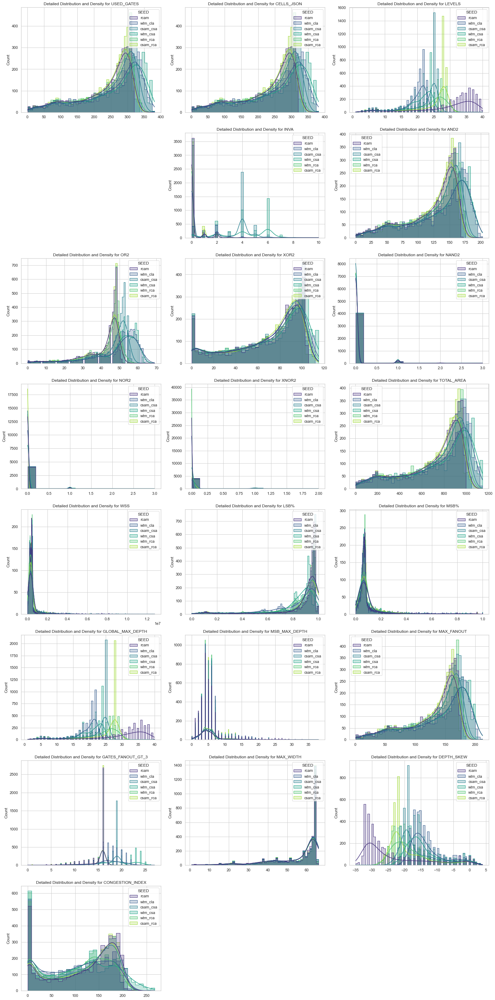

In [ ]:
features = df_fast.columns.drop('SEED') # Change 'Type' to your target column name

plt.figure(figsize=(20, 50))
for i, feature in enumerate(features):
    if feature == 'IDA':
        continue
    plt.subplot(10, 3, i+1)
    sns.histplot(data=df_fast, x=feature, hue='SEED', kde=True, element="step", palette='viridis')
    plt.title(f'Detailed Distribution and Density for {feature}')
    plt.xlabel('')

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler

# 1. Normalize the data
scaler = MinMaxScaler()
# Ensure we only scale numeric columns, excluding the 'SEED' string column
features = df_fast.columns.drop('SEED')
df_scaled = df_fast.copy()
df_scaled[features] = scaler.fit_transform(df_fast[features])

# 2. Convert 'SEED' strings to numeric IDs for Plotly's color scale
# This creates a new column 'SEED_ID' (0, 1, 2...)
df_scaled['SEED_ID'], seed_names = pd.factorize(df_scaled['SEED'])

# 3. Create the Parallel Coordinates Plot
fig = px.parallel_coordinates(
    df_scaled, 
    color="SEED_ID", # Use the new numeric ID for the color scale
    # This dictionary maps the display names for the axes
    labels={col: col.replace('_', ' ') for col in df_fast.columns},
    color_continuous_scale=px.colors.diverging.Tealrose,
    title="Seed Varieties: Identifying Feature Specialists"
)

# Optional: Improve the color bar to show the actual names instead of 0, 1, 2
fig.update_layout(coloraxis_colorbar=dict(
    title="Seed Type",
    tickvals=list(range(len(seed_names))),
    ticktext=list(seed_names),
))

fig.show()

In [ ]:
from sklearn.feature_selection import f_classif
import pandas as pd

# 1. Identify your target and features
target_col = 'SEED'
features = df_fast.columns.drop(target_col)
results = {}

# 2. Calculate "Power" for each seed individually
for seed_type in df_fast[target_col].unique():
    # Create a binary target: Is it this seed or not?
    y_binary = (df_fast[target_col] == seed_type).astype(int)
    X = df_fast[features]
    
    # Calculate F-scores for this specific seed vs. the rest
    f_scores, _ = f_classif(X, y_binary)
    results[seed_type] = f_scores

# 3. Format into a Leaderboard
ovr_df = pd.DataFrame(results, index=features)
print("--- One-vs-Rest Separability (F-Scores) ---")
print(ovr_df.round(2))

# 4. Highlight the "Winner" for each seed
for seed in ovr_df.columns:
    best_feat = ovr_df[seed].idxmax()
    score = ovr_df[seed].max()
    print(f"\nBest Specialist for {seed}: {best_feat} (Score: {score:.2f})")

--- One-vs-Rest Separability (F-Scores) ---
                      rcam  wtm_cla  csam_csa   wtm_csa  wtm_rca  csam_rca
USED_GATES           98.82    96.89      5.24    185.75    49.71     81.44
CELLS_JSON           98.82    96.89      5.24    185.75    49.71     81.44
LEVELS             4771.27  1379.80    135.55    823.27     0.20    174.34
IDA                    NaN      NaN       NaN       NaN      NaN       NaN
INVA               1948.26  1400.09   5963.45  12638.86  1890.23   1853.59
AND2                 97.42   153.50      0.21    163.14    42.40     89.80
OR2                 467.57   655.12     19.88    530.93   182.92    335.37
XOR2                  4.67     4.42      0.53     20.08     4.45      2.73
NAND2                 0.00     2.91      3.39      2.23     0.80      0.17
NOR2                  5.52     6.25      7.41    111.12     6.68     29.99
XNOR2               131.10   122.65    743.45     22.47   137.81    140.79
TOTAL_AREA           57.82    64.86      1.05    111.86 

C:\Users\nivan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning:

Features [3] are constant.

C:\Users\nivan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning:

invalid value encountered in divide

C:\Users\nivan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning:

Features [3] are constant.

C:\Users\nivan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning:

invalid value encountered in divide

C:\Users\nivan\AppData\Local

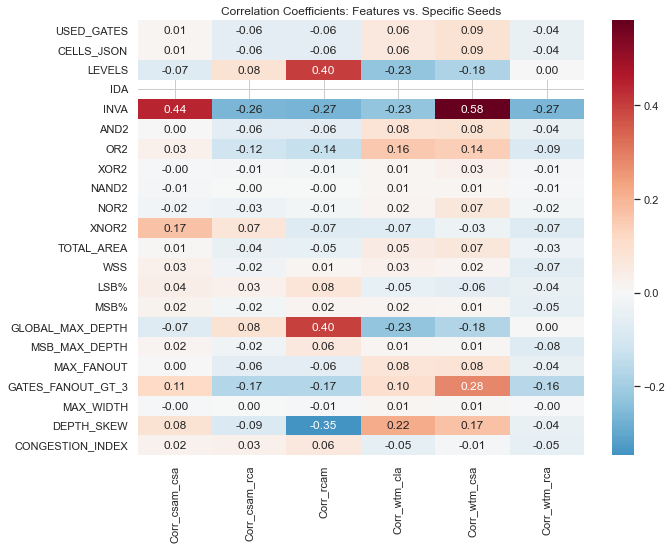

                   Corr_csam_csa  Corr_csam_rca  Corr_rcam  Corr_wtm_cla  \
USED_GATES              0.014510      -0.057092  -0.062867      0.062254   
CELLS_JSON              0.014510      -0.057092  -0.062867      0.062254   
LEVELS                 -0.073576       0.083378   0.400977     -0.229120   
IDA                          NaN            NaN        NaN           NaN   
INVA                    0.439540      -0.263199  -0.269360     -0.230710   
AND2                    0.002909      -0.059941  -0.062421      0.078268   
OR2                     0.028243      -0.115272  -0.135754      0.160099   
XOR2                   -0.004607      -0.010476  -0.013699      0.013323   
NAND2                  -0.011667      -0.002641  -0.000398      0.010812   
NOR2                   -0.017245      -0.034684  -0.014883      0.015845   
XNOR2                   0.170257       0.074976  -0.072365     -0.070005   
TOTAL_AREA              0.006501      -0.042947  -0.048129      0.050968   
WSS         

In [ ]:
# 1. Create Dummy variables for the SEED column
# This turns 'SEED' into three columns: SEED_Kama, SEED_Rosa, etc. (0 or 1)
df_dummies = pd.get_dummies(df_fast, columns=['SEED'], prefix='Corr')

# 2. Calculate the Correlation Matrix
# We only want the correlation between original features and the new Seed columns
features = df_fast.columns.drop('SEED')
seed_cols = [col for col in df_dummies.columns if col.startswith('Corr_')]
corr_matrix = df_dummies[list(features) + seed_cols].corr()

# 3. Extract only the Feature vs Seed relationships
final_corr = corr_matrix.loc[features, seed_cols]

# 4. Plot the Heatmap with Coefficient Values
plt.figure(figsize=(10, 8))
sns.heatmap(final_corr, annot=True, cmap='RdBu_r', center=0, fmt=".2f")
plt.title("Correlation Coefficients: Features vs. Specific Seeds")
plt.show()

# 5. Print the ranked coefficients for a clear list
print(final_corr)

In [ ]:
from sklearn.feature_selection import f_classif

# 1. Calculate F-Scores (The global distinguishing power)
X = df_fast.drop('SEED', axis=1)
y = df_fast['SEED']
f_values, _ = f_classif(X, y)

# 2. Create the ranking table
coefficients_df = pd.DataFrame({
    'Feature': X.columns,
    'Separability_F_Score': f_values
}).sort_values(by='Separability_F_Score', ascending=False)

print(coefficients_df)

              Feature  Separability_F_Score
4                INVA           9751.387021
2              LEVELS           1363.871520
15   GLOBAL_MAX_DEPTH           1329.748592
20         DEPTH_SKEW           1073.852810
18  GATES_FANOUT_GT_3            902.770109
6                 OR2            385.815929
10              XNOR2            221.534901
5                AND2             92.223007
17         MAX_FANOUT             88.036304
0          USED_GATES             87.340763
1          CELLS_JSON             87.340763
13               LSB%             66.996430
11         TOTAL_AREA             52.272681
21   CONGESTION_INDEX             44.682582
16      MSB_MAX_DEPTH             43.789688
12                WSS             29.648509
9                NOR2             27.835928
14               MSB%             17.728819
7                XOR2              6.144270
8               NAND2              1.581878
19          MAX_WIDTH              0.869516
3                 IDA           

C:\Users\nivan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning:

Features [3] are constant.

C:\Users\nivan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning:

invalid value encountered in divide



--- Correlation Coefficients (Point-Biserial) ---
                   Corr_csam_csa  Corr_csam_rca  Corr_rcam  Corr_wtm_cla  \
USED_GATES                 0.015         -0.057     -0.063         0.062   
CELLS_JSON                 0.015         -0.057     -0.063         0.062   
LEVELS                    -0.074          0.083      0.401        -0.229   
IDA                          NaN            NaN        NaN           NaN   
INVA                       0.440         -0.263     -0.269        -0.231   
AND2                       0.003         -0.060     -0.062         0.078   
OR2                        0.028         -0.115     -0.136         0.160   
XOR2                      -0.005         -0.010     -0.014         0.013   
NAND2                     -0.012         -0.003     -0.000         0.011   
NOR2                      -0.017         -0.035     -0.015         0.016   
XNOR2                      0.170          0.075     -0.072        -0.070   
TOTAL_AREA                 0.007      

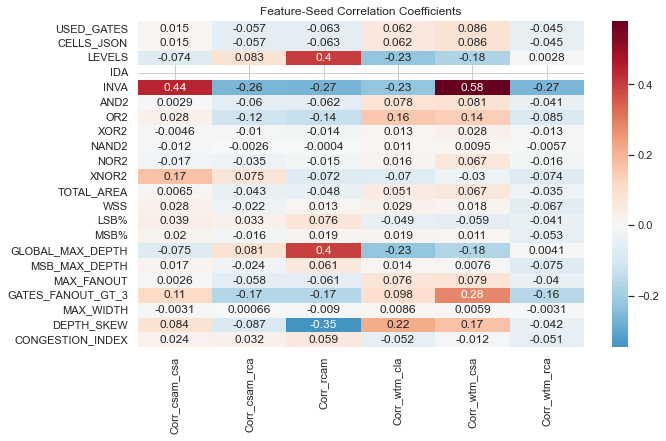

In [ ]:
# 1. Create dummy variables (One-Hot Encoding) for the SEED column
# This creates new columns: SEED_Kama, SEED_Rosa, etc., filled with 0s and 1s
df_dummies = pd.get_dummies(df_fast, columns=['SEED'], prefix='Corr')

# 2. Define your original numeric features
# (Excludes the newly created dummy columns)
numeric_features = df_fast.columns.drop('SEED')

# 3. Calculate the correlation matrix for the whole dataframe
corr_matrix = df_dummies.corr()

# 4. Extract only the relationship between Features and the Seeds
# We look at the rows (Features) and columns (Seed Dummies)
seed_columns = [col for col in df_dummies.columns if col.startswith('Corr_')]
coefficient_table = corr_matrix.loc[numeric_features, seed_columns]

# 5. Display the results
print("--- Correlation Coefficients (Point-Biserial) ---")
print(coefficient_table.round(3))

# 6. Optional: Visualize as a Heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(coefficient_table, annot=True, cmap='RdBu_r', center=0)
plt.title("Feature-Seed Correlation Coefficients")
plt.show()

--- Correlation Coefficients (Point-Biserial) ---
                   Corr_csam_csa  Corr_csam_rca  Corr_rcam  Corr_wtm_cla  \
USED_GATES                 0.027         -0.099     -0.097         0.098   
CELLS_JSON                 0.027         -0.099     -0.097         0.098   
LEVELS                    -0.059          0.178      0.394        -0.328   
IDA                          NaN            NaN        NaN           NaN   
INVA                       0.469         -0.253     -0.277        -0.217   
AND2                       0.006         -0.102     -0.095         0.118   
OR2                        0.071         -0.195     -0.213         0.238   
XOR2                      -0.010         -0.029     -0.024         0.021   
NAND2                     -0.011         -0.004     -0.003         0.010   
NOR2                      -0.017         -0.035     -0.016         0.017   
XNOR2                      0.170          0.076     -0.073        -0.070   
TOTAL_AREA                 0.012      

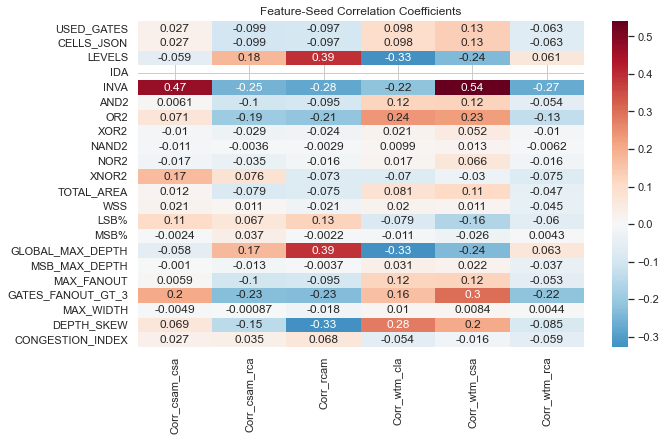

In [ ]:
# 1. Create dummy variables (One-Hot Encoding) for the SEED column
# This creates new columns: SEED_Kama, SEED_Rosa, etc., filled with 0s and 1s
df_dummies = pd.get_dummies(df_fast, columns=['SEED'], prefix='Corr')

# 2. Define your original numeric features
# (Excludes the newly created dummy columns)
numeric_features = df_fast.columns.drop('SEED')

# 3. Calculate the correlation matrix for the whole dataframe
corr_matrix = df_dummies.corr(method='spearman')

# 4. Extract only the relationship between Features and the Seeds
# We look at the rows (Features) and columns (Seed Dummies)
seed_columns = [col for col in df_dummies.columns if col.startswith('Corr_')]
coefficient_table = corr_matrix.loc[numeric_features, seed_columns]

# 5. Display the results
print("--- Correlation Coefficients (Point-Biserial) ---")
print(coefficient_table.round(3))

# 6. Optional: Visualize as a Heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(coefficient_table, annot=True, cmap='RdBu_r', center=0)
plt.title("Feature-Seed Correlation Coefficients")
plt.show()

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\370052107.py:3: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



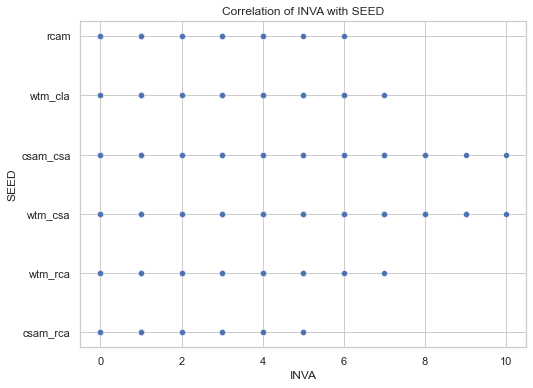

In [ ]:
# Visualize the correlation of INVA with SEED using a scatter plot
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_fast, x='INVA', y='SEED', palette='viridis')
plt.title('Correlation of INVA with SEED')
plt.show()

C:\Users\nivan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.



--- Top 10 Pairs with Unique Internal Correlations ---
                         Pair   rcam  wtm_cla  csam_csa  wtm_csa  wtm_rca  \
94   INVA vs CONGESTION_INDEX -0.200   -0.271     0.581    0.837   -0.261   
88   INVA vs GLOBAL_MAX_DEPTH -0.191   -0.253     0.658    0.833   -0.260   
42             LEVELS vs INVA -0.189   -0.254     0.658    0.833   -0.259   
91  INVA vs GATES_FANOUT_GT_3 -0.087   -0.221     0.565    0.811   -0.029   
3          USED_GATES vs INVA -0.188   -0.220     0.504    0.749   -0.230   
23         CELLS_JSON vs INVA -0.188   -0.220     0.504    0.749   -0.230   
84         INVA vs TOTAL_AREA -0.193   -0.224     0.493    0.735   -0.239   
78               INVA vs AND2 -0.195   -0.230     0.494    0.734   -0.234   
90         INVA vs MAX_FANOUT -0.194   -0.230     0.492    0.733   -0.233   
80               INVA vs XOR2 -0.196   -0.219     0.472    0.701   -0.249   

    csam_rca  Corr_Spread  
94    -0.062        1.108  
88    -0.011        1.093  
42    -0.001 

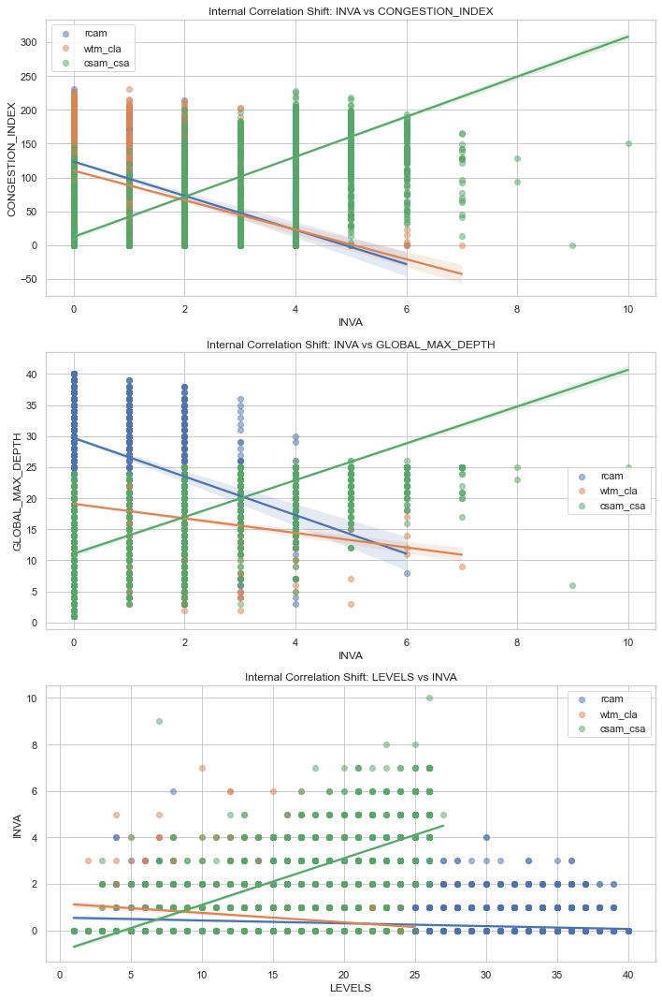

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import combinations

# 1. Setup features and seeds
features = df_fast.columns.drop('SEED')
seeds = df_fast['SEED'].unique()
pairs = list(combinations(features, 2))

# 2. Calculate Correlation per Pair PER Seed
results = []
for f1, f2 in pairs:
    row = {'Pair': f"{f1} vs {f2}", 'f1': f1, 'f2': f2}
    for s in seeds:
        subset = df_fast[df_fast['SEED'] == s]
        # Using Spearman as it handles the smaller subset sizes better
        row[s] = subset[f1].corr(subset[f2], method='spearman')
    
    # Calculate how much the correlation differs between the seeds
    # High spread means the relationship is unique for at least one seed
    row['Corr_Spread'] = max(row[s] for s in seeds) - min(row[s] for s in seeds)
    results.append(row)

# 3. Get Top 10 pairs where the relationship changes the most between seeds
top_corr_pairs = pd.DataFrame(results).sort_values(by='Corr_Spread', ascending=False).head(10)

print("--- Top 10 Pairs with Unique Internal Correlations ---")
print(top_corr_pairs[['Pair'] + list(seeds) + ['Corr_Spread']].round(3))

# 4. Plot the top 3 as Scatter Plots with Regression Lines per Seed
# This visually shows how the "Slope" or "Tightness" changes per seed
top_3 = top_corr_pairs.head(3)

fig, axes = plt.subplots(3, 1, figsize=(10, 15))
for i, (_, row) in enumerate(top_3.iterrows()):
    sns.regplot(data=df_fast[df_fast['SEED']==seeds[0]], x=row['f1'], y=row['f2'], 
                label=seeds[0], ax=axes[i], scatter_kws={'alpha':0.5})
    sns.regplot(data=df_fast[df_fast['SEED']==seeds[1]], x=row['f1'], y=row['f2'], 
                label=seeds[1], ax=axes[i], scatter_kws={'alpha':0.5})
    sns.regplot(data=df_fast[df_fast['SEED']==seeds[2]], x=row['f1'], y=row['f2'], 
                label=seeds[2], ax=axes[i], scatter_kws={'alpha':0.5})
    
    axes[i].set_title(f"Internal Correlation Shift: {row['Pair']}")
    axes[i].legend()

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
from itertools import combinations

df_fast.drop(columns=['USED_GATES'], inplace=True)  # Ensure SEED is not in the features for correlation

# 1. Setup
features = df_fast.columns.drop('SEED')
seeds = df_fast['SEED'].unique()
pairs = list(combinations(features, 2))
all_results = []

# 2. Calculate Correlation for every pair, grouped by Seed
for s in seeds:
    subset = df_fast[df_fast['SEED'] == s]
    for f1, f2 in pairs:
        # We use Spearman to capture the 'tightness' of the relationship 
        # regardless of whether it's a perfectly straight line
        corr = subset[f1].corr(subset[f2], method='spearman')
        all_results.append({
            'Seed': s,
            'Pair': f"{f1} vs {f2}",
            'f1': f1,
            'f2': f2,
            'Correlation': corr,
            'Abs_Correlation': abs(corr)
        })

df_results = pd.DataFrame(all_results)

# 3. Print Top 10 for each seed
for s in seeds:
    print(f"\n--- TOP 10 FEATURE PAIRS FOR: {s} ---")
    top_10 = df_results[df_results['Seed'] == s].sort_values(by='Abs_Correlation', ascending=False).head(10)
    print(top_10[['Pair', 'Correlation']].to_string(index=False))

C:\Users\nivan\AppData\Local\Temp\ipykernel_13304\3188827365.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\nivan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.




--- TOP 10 FEATURE PAIRS FOR: rcam ---
                      Pair  Correlation
        AND2 vs MAX_FANOUT     0.999881
  CELLS_JSON vs TOTAL_AREA     0.998891
        CELLS_JSON vs AND2     0.998714
  CELLS_JSON vs MAX_FANOUT     0.998609
LEVELS vs GLOBAL_MAX_DEPTH     0.996615
        AND2 vs TOTAL_AREA     0.996228
  TOTAL_AREA vs MAX_FANOUT     0.996065
        XOR2 vs TOTAL_AREA     0.994513
        CELLS_JSON vs XOR2     0.988813
              AND2 vs XOR2     0.983230

--- TOP 10 FEATURE PAIRS FOR: wtm_cla ---
                      Pair  Correlation
        AND2 vs MAX_FANOUT     0.999942
        CELLS_JSON vs AND2     0.999088
  CELLS_JSON vs MAX_FANOUT     0.998993
  CELLS_JSON vs TOTAL_AREA     0.998578
        AND2 vs TOTAL_AREA     0.996389
  TOTAL_AREA vs MAX_FANOUT     0.996195
        XOR2 vs TOTAL_AREA     0.988765
        CELLS_JSON vs XOR2     0.979977
LEVELS vs GLOBAL_MAX_DEPTH     0.976410
              AND2 vs XOR2     0.974246

--- TOP 10 FEATURE PAIRS FOR: csam_c

In [ ]:
# 1. Setup
features = df_fast.columns.drop('SEED')
seeds = df_fast['SEED'].unique()
pairs = list(combinations(features, 2))
all_results = []

# 2. Calculate Correlation for every pair, grouped by Seed
for s in seeds:
    subset = df_fast[df_fast['SEED'] == s]
    for f1, f2 in pairs:
        # We use Spearman to capture the 'tightness' of the relationship 
        # regardless of whether it's a perfectly straight line
        corr = subset[f1].corr(subset[f2], method='pearson')
        all_results.append({
            'Seed': s,
            'Pair': f"{f1} vs {f2}",
            'f1': f1,
            'f2': f2,
            'Correlation': corr,
            'Abs_Correlation': abs(corr)
        })

df_results = pd.DataFrame(all_results)

# 3. Print Top 10 for each seed
for s in seeds:
    print(f"\n--- TOP 10 FEATURE PAIRS FOR: {s} ---")
    top_10 = df_results[df_results['Seed'] == s].sort_values(by='Abs_Correlation', ascending=False).head(10)
    print(top_10[['Pair', 'Correlation']].to_string(index=False))

C:\Users\nivan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning:

invalid value encountered in divide

C:\Users\nivan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning:

invalid value encountered in divide




--- TOP 10 FEATURE PAIRS FOR: rcam ---
                      Pair  Correlation
        AND2 vs MAX_FANOUT     0.999767
        CELLS_JSON vs AND2     0.999405
  CELLS_JSON vs MAX_FANOUT     0.999121
LEVELS vs GLOBAL_MAX_DEPTH     0.998822
  CELLS_JSON vs TOTAL_AREA     0.998728
        AND2 vs TOTAL_AREA     0.997200
  TOTAL_AREA vs MAX_FANOUT     0.996345
        XOR2 vs TOTAL_AREA     0.991339
        CELLS_JSON vs XOR2     0.983486
              AND2 vs XOR2     0.979408

--- TOP 10 FEATURE PAIRS FOR: wtm_cla ---
                      Pair  Correlation
        AND2 vs MAX_FANOUT     0.999786
        CELLS_JSON vs AND2     0.999387
  CELLS_JSON vs MAX_FANOUT     0.999201
  CELLS_JSON vs TOTAL_AREA     0.998736
        AND2 vs TOTAL_AREA     0.997461
  TOTAL_AREA vs MAX_FANOUT     0.996697
LEVELS vs GLOBAL_MAX_DEPTH     0.994764
        XOR2 vs TOTAL_AREA     0.990125
        CELLS_JSON vs XOR2     0.981868
              AND2 vs XOR2     0.978581

--- TOP 10 FEATURE PAIRS FOR: csam_c

Accuracy: 0.6663454589255601


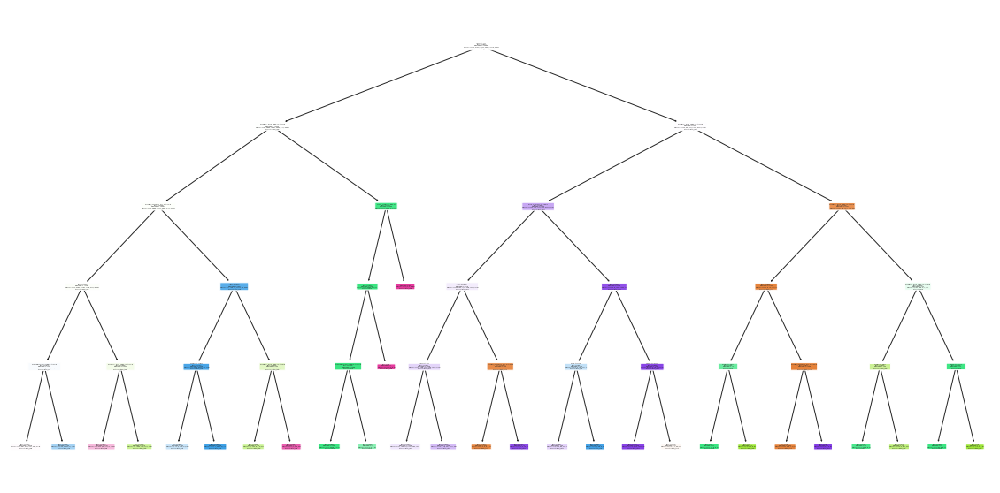

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

# 1. Prep your data
X = df_fast.drop('SEED', axis=1)
y = df_fast['SEED']

# 2. Train a tree (keep it shallow so it's readable)
clf = DecisionTreeClassifier(max_depth=5, random_state=42)
clf.fit(X, y)

#print accuracy
print("Accuracy:", clf.score(X, y))

# 3. Visualize the "Rules"
plt.figure(figsize=(20,10))
plot_tree(clf, feature_names=X.columns, class_names=clf.classes_, filled=True, rounded=True)
plt.show()

In [ ]:
# Assuming your model is named 'clf'
importances = pd.Series(clf.feature_importances_, index=X.columns).sort_values(ascending=False)

print("--- Top 5 Features ---")
print(importances.head(5))

print("\n--- Bottom 5 Features (The 'Noise') ---")
print(importances.tail(5))

--- Top 5 Features ---
GLOBAL_MAX_DEPTH     0.434691
INVA                 0.268613
GATES_FANOUT_GT_3    0.153552
LEVELS               0.050742
MAX_FANOUT           0.043861
dtype: float64

--- Bottom 5 Features (The 'Noise') ---
MSB_MAX_DEPTH    0.0
IDA              0.0
MAX_WIDTH        0.0
DEPTH_SKEW       0.0
CELLS_JSON       0.0
dtype: float64


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# 1. Train a Forest instead of a single Tree
rf_model = RandomForestClassifier(n_estimators=100, max_depth=7, random_state=42)
rf_model.fit(X_train, y_train)

# 2. Check the jump in accuracy
predictions = rf_model.predict(X_test)
print(f"Random Forest Accuracy: {accuracy_score(y_test, predictions):.2f}")

Random Forest Accuracy: 0.76


In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report

# 1. Encode the Seed names into 0, 1, 2
le = LabelEncoder()
y_encoded = le.fit_transform(df_fast['SEED'])

# 2. Split the data (80% training, 20% testing)
# 'stratify' ensures each seed variety is equally represented in both sets
X = df_fast.drop('SEED', axis=1)
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)

# 3. Initialize and Train XGBoost
# We use a lower learning_rate to prevent the model from overshooting the patterns
xgb_model = XGBClassifier(
    n_estimators=100, 
    learning_rate=0.05, 
    max_depth=6, 
    use_label_encoder=False, 
    eval_metric='mlogloss',
    random_state=42
)

xgb_model.fit(X_train, y_train)

# 4. Evaluate the Model
y_pred = xgb_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)

print(f"XGBoost Test Accuracy: {accuracy:.4f}")
print("\nDetailed Classification Report:")
print(classification_report(y_test, y_pred, target_names=le.classes_))

C:\Users\nivan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\xgboost\training.py:200: UserWarning:

[16:11:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.




XGBoost Test Accuracy: 0.7985

Detailed Classification Report:
              precision    recall  f1-score   support

    csam_csa       0.80      0.85      0.82       841
    csam_rca       0.80      0.70      0.75       828
        rcam       0.82      0.87      0.85       815
     wtm_cla       0.88      0.82      0.85       840
     wtm_csa       0.76      0.84      0.80       844
     wtm_rca       0.73      0.71      0.72       814

    accuracy                           0.80      4982
   macro avg       0.80      0.80      0.80      4982
weighted avg       0.80      0.80      0.80      4982



In [ ]:
# 1. Get feature importance from your trained XGB model
importances = pd.Series(xgb_model.feature_importances_, index=X.columns).sort_values(ascending=False)

# 2. Print the list to see the drop-off
print(importances.head(10))

# 3. Create a list of only the top 7 features
top_features = importances.head(7).index.tolist()

# 4. Retrain the model using ONLY these 7
X_train_slim = X_train[top_features]
X_test_slim = X_test[top_features]

xgb_model.fit(X_train_slim, y_train)
new_accuracy = xgb_model.score(X_test_slim, y_test)
print(f"New Test Accuracy with Top 7 Features: {new_accuracy:.4f}")

GLOBAL_MAX_DEPTH     0.199080
INVA                 0.168961
LEVELS               0.120912
GATES_FANOUT_GT_3    0.105883
MAX_FANOUT           0.051094
CELLS_JSON           0.044329
DEPTH_SKEW           0.040831
AND2                 0.038878
OR2                  0.036999
CONGESTION_INDEX     0.035969
dtype: float32


C:\Users\nivan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\xgboost\training.py:200: UserWarning:

[16:12:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.




New Test Accuracy with Top 7 Features: 0.7672
